<a href="https://colab.research.google.com/github/yashagrawal5757/InternetServicePrice_Prediction/blob/main/CIS_545_Project_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CIS 5450 BIG DATA ANALYTICS PROJECT
###### TEAM MEMBERS - YASH AGRAWAL, PRIYANKA AGARWAL, PURVANSH JAIN
### DATASET: INTERNET SERVICE OFFERS DATASET
##### PROJECT TITLE - PRICE PREDICTION BASED ON DIFFERENT FEATURES IN DATASET

In this project, we want to perform comprehensive predictive analysis on how internet service prices fluctuate across different providers over a certain demographic, bandwidth, geographic location and other characteristics.


##### **IMPORTS**

In [ ]:
# Library import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

from wordcloud import WordCloud


##### **CONNECTING TO GOOGLE DRIVE TO FETCH DATA**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **LOADING DATASETS AND QUICK VIEW OF COLUMNS AND DATA**

OUR AIM IS TO MAKE SURE EVERY INDIVIDUAL DATASET HAS THE SAME SCHEMA AFTER PREPROCESSING AND CLEANING STEPS SO WE CAN MERGE AND DO FURTHER ANALYSIS AND MANIPULATION ON THE COMPLETE DATA.

**READING AT&T DATA FROM speed_price_att.csv**

In [ ]:
att_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_att.csv')

In [ ]:
#Analysing dimension of att_df
att_df.shape

(432303, 26)

In [ ]:
#checking data types of every column
att_df.dtypes

address_full                    object
incorporated_place              object
major_city                      object
state                           object
lat                            float64
lon                            float64
block_group                      int64
collection_datetime              int64
provider                        object
speed_down                     float64
speed_up                       float64
speed_unit                      object
price                          float64
technology                      object
package                         object
fastest_speed_down             float64
fastest_speed_price            float64
fn                              object
redlining_grade                 object
race_perc_non_white            float64
income_lmi                     float64
ppl_per_sq_mile                float64
n_providers                    float64
income_dollars_below_median    float64
internet_perc_broadband        float64
median_household_income  

In [ ]:
#understanding column names
att_df.columns

Index(['address_full', 'incorporated_place', 'major_city', 'state', 'lat',
       'lon', 'block_group', 'collection_datetime', 'provider', 'speed_down',
       'speed_up', 'speed_unit', 'price', 'technology', 'package',
       'fastest_speed_down', 'fastest_speed_price', 'fn', 'redlining_grade',
       'race_perc_non_white', 'income_lmi', 'ppl_per_sq_mile', 'n_providers',
       'income_dollars_below_median', 'internet_perc_broadband',
       'median_household_income'],
      dtype='object')

In [ ]:
# Display the first 10 rows
print(att_df.head(10))


                                    address_full incorporated_place  \
0  2406 Country Club Ave NW, Huntsville AL 35816    Huntsville city   
1        1902 Oglesby Dr NW, Huntsville AL 35816    Huntsville city   
2      2312 Cardinal Ave NW, Huntsville AL 35816    Huntsville city   
3        1903 Oglesby Dr NW, Huntsville AL 35816    Huntsville city   
4    1905 Canterbury Cir NW, Huntsville AL 35816    Huntsville city   
5    1811 Canterbury Cir NW, Huntsville AL 35816    Huntsville city   
6         1814 Canary St NW, Huntsville AL 35816    Huntsville city   
7  2211 Country Club Ave NW, Huntsville AL 35816    Huntsville city   
8      2411 Cardinal Ave NW, Huntsville AL 35816    Huntsville city   
9    1800 Canterbury Cir NW, Huntsville AL 35816    Huntsville city   

   major_city state        lat        lon  block_group  collection_datetime  \
0  huntsville    AL  34.745179 -86.606806  10890007022           1650310200   
1  huntsville    AL  34.747563 -86.607140  10890007022      

**Understanding packages and their respective fast/slow speends and cheap/coslty price**

In [ ]:
#creating a temporary dataframe view with relevant columns
att_df[['package','fastest_speed_price','price','speed_down','fastest_speed_down']]

,package,fastest_speed_price,price,speed_down,fastest_speed_down
0,Internet Basic 768kbps,55.0,55.0,0.768,0.768
1,Internet Basic 5,55.0,55.0,5.000,5.000
2,Internet Basic 768kbps,55.0,55.0,0.768,0.768
3,Internet Basic 5,55.0,55.0,5.000,5.000
4,AT&T FIBER—INTERNET 300,180.0,55.0,300.000,5000.000
...,...,...,...,...,...
432298,AT&T FIBER—INTERNET 300,80.0,55.0,300.000,1000.000
432299,AT&T FIBER—INTERNET 300,80.0,55.0,300.000,1000.000
432300,AT&T FIBER—INTERNET 300,80.0,55.0,300.000,1000.000
432301,Internet 50,55.0,55.0,50.000,50.000


Checking other cities dataset for AT&T - speed_price_att_other_cities.csv

In [ ]:
att_other_cities_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_att_other_cities.csv')

In [ ]:
#comparing the columns of att_df and att_other_cities_df
set(att_df.columns) - set(att_other_cities_df.columns)

{'income_dollars_below_median', 'income_lmi', 'n_providers', 'ppl_per_sq_mile'}

In [ ]:
set(att_other_cities_df.columns)  - set(att_df.columns)

{'availability_status', 'geoid'}

**OBSERVATIONS FROM COLUMN COMPARISONS**

Noting that the following columns are in att_df and not in att_other_cities_df:
{'income_dollars_below_median', 'income_lmi', 'n_providers', 'ppl_per_sq_mile'} .

{'availability_status', 'geoid'} - there in att_other_cities_df and not in att_df

**READING CENTURYLINK DATA FROM speed_price_centurylink.csv**

In [ ]:
#Reading .csv file into a centurylink_df dataframa
centurylink_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_centurylink.csv')

In [ ]:
#comparing the columns of centurylink_df and att_df
set(centurylink_df.columns)  - set(att_df.columns)

{'address_full_closest_fiber',
 'closest_fiber_miles',
 'lat_closest_fiber',
 'lon_closest_fiber'}

In [ ]:
# Columns in att_df which are not there in centurylink_df
set(att_df.columns) -   set(centurylink_df.columns)  

set()

** READING EARTHLINK DATA FROM speed_price_earthlink.csv **

In [ ]:
#Reading .csv file into a earthlink_df dataframa
earthlink_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_earthlink.csv')

In [ ]:
#viewing columns of earthlink_df
earthlink_df.columns

Index(['address_full', 'incorporated_place', 'major_city', 'state', 'lat',
       'lon', 'block_group', 'collection_datetime', 'provider', 'price',
       'speed_down', 'speed_up', 'speed_unit', 'technology', 'package',
       'fastest_speed_down', 'fastest_speed_price', 'fn', 'contract_provider',
       'redlining_grade', 'race_perc_non_white', 'income_lmi',
       'ppl_per_sq_mile', 'n_providers', 'income_dollars_below_median',
       'internet_perc_broadband', 'median_household_income'],
      dtype='object')

In [ ]:
# comparing columns
set(earthlink_df.columns) - set(att_df.columns)  
# contract provider column is unique to earthlink_df

{'contract_provider'}

**READING VERIZON DATA FROM speed_price_verizon.csv**

In [ ]:
#.csv file
verizon_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_verizon.csv')

In [ ]:
#viewing columns
verizon_df.columns

Index(['address_full', 'incorporated_place', 'major_city', 'state', 'lat',
       'lon', 'block_group', 'collection_datetime', 'in_service', 'provider',
       'speed_down', 'speed_up', 'speed_unit', 'price', 'technology',
       'package', 'fastest_speed_down', 'fastest_speed_price', 'fn',
       'redlining_grade', 'closest_fiber_miles', 'address_full_closest_fiber',
       'lat_closest_fiber', 'lon_closest_fiber', 'race_perc_non_white',
       'income_lmi', 'ppl_per_sq_mile', 'n_providers',
       'income_dollars_below_median', 'internet_perc_broadband',
       'median_household_income'],
      dtype='object')

In [ ]:
#comparing columns with att_df
set(verizon_df.columns) -   set(att_df.columns)  

{'address_full_closest_fiber',
 'closest_fiber_miles',
 'in_service',
 'lat_closest_fiber',
 'lon_closest_fiber'}

## **PREPROCESSING AND CLEANING OF DATA**

# CLEANING att_df and att_other_cities_df

CHECKING DATATYPES

In [ ]:
## att_sd dtypes
att_df.dtypes

address_full                    object
incorporated_place              object
major_city                      object
state                           object
lat                            float64
lon                            float64
block_group                      int64
collection_datetime              int64
provider                        object
speed_down                     float64
speed_up                       float64
speed_unit                      object
price                          float64
technology                      object
package                         object
fastest_speed_down             float64
fastest_speed_price            float64
fn                              object
redlining_grade                 object
race_perc_non_white            float64
income_lmi                     float64
ppl_per_sq_mile                float64
n_providers                    float64
income_dollars_below_median    float64
internet_perc_broadband        float64
median_household_income  

Observations:
Float colums - 'speed_down','speed_up','price','fastest_speed_down','fastest_speed_price','race_perc_non_white','income_lmi','ppl_per_sq_mile','income_dollars_below_median','internet_perc_broadband','median_household_income'

Integer columns - n_providers,

Handling redundancy due to space anomalies in packages

In [ ]:
att_df.package.value_counts()

AT&T FIBER—INTERNET 300      141139
Internet 50                   52400
Internet 100                  34651
Internet 75                   23280
Internet 25                   18469
Internet 18                   18462
Internet Basic 5              17688
Internet 10                   16017
AT&T FIBER — INTERNET 300     11605
Internet Basic 768kbps         9572
Internet Basic 1.5             6032
Internet Basic 3                379
AT&T FIBER — INTERNET 500         6
AT&T FIBER—INTERNET 500           1
AT&T FIBER—INTERNET 100           1
AT&T FIBER—INTERNET 2000          1
Name: package, dtype: int64

In [ ]:
#AT&T FIBER — INTERNET 300, AT&T FIBER—INTERNET 300
#AT&T FIBER — INTERNET 500, AT&T FIBER—INTERNET 500
att_df['package'].loc[att_df['package'] == 'AT&T FIBER — INTERNET 300'] = 'AT&T FIBER—INTERNET 300'
att_df['package'].loc[att_df['package'] == 'AT&T FIBER — INTERNET 500'] = 'AT&T FIBER—INTERNET 500'
att_df.package.value_counts()


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


AT&T FIBER—INTERNET 300     152744
Internet 50                  52400
Internet 100                 34651
Internet 75                  23280
Internet 25                  18469
Internet 18                  18462
Internet Basic 5             17688
Internet 10                  16017
Internet Basic 768kbps        9572
Internet Basic 1.5            6032
Internet Basic 3               379
AT&T FIBER—INTERNET 500          7
AT&T FIBER—INTERNET 100          1
AT&T FIBER—INTERNET 2000         1
Name: package, dtype: int64

Understanding patterns of min and max prices for costly and cheap plans

In [ ]:
#creating a lowest price plan dataframe
lowest_plan_df = att_df.groupby('package').price.agg(['mean', 'min', 'max']).reset_index()
lowest_plan_df = lowest_plan_df.rename(columns = {'mean':'lowest_plan_mean','min':'lowest_plan_min','max':'lowest_plan_max'})
lowest_plan_df

,package,lowest_plan_mean,lowest_plan_min,lowest_plan_max
0,AT&T FIBER—INTERNET 100,65.000000,65.0,65.0
1,AT&T FIBER—INTERNET 2000,0.000000,0.0,0.0
2,AT&T FIBER—INTERNET 300,54.986415,30.0,55.0
3,AT&T FIBER—INTERNET 500,55.714286,0.0,65.0
4,Internet 10,55.000000,55.0,55.0
5,Internet 100,55.000000,55.0,55.0
6,Internet 18,55.000000,55.0,55.0
7,Internet 25,54.997022,0.0,55.0
8,Internet 50,55.000000,55.0,55.0
9,Internet 75,55.000000,55.0,55.0


In [ ]:
#creating a hightest prices plan dataframe
highest_plan_df = att_df.groupby('package').fastest_speed_price.agg(['mean', 'min', 'max'])
highest_plan_df = highest_plan_df.rename(columns = {'mean':'highest_plan_mean','min':'highest_plan_min','max':'highest_plan_max'})
highest_plan_df

,highest_plan_mean,highest_plan_min,highest_plan_max
package,,,
AT&T FIBER—INTERNET 100,65.000000,65.0,65.0
AT&T FIBER—INTERNET 2000,185.000000,185.0,185.0
AT&T FIBER—INTERNET 300,128.613432,80.0,185.0
AT&T FIBER—INTERNET 500,82.142857,65.0,185.0
Internet 10,55.000000,55.0,55.0
Internet 100,55.000000,55.0,55.0
Internet 18,55.000000,55.0,55.0
Internet 25,55.000271,55.0,60.0
Internet 50,55.000000,55.0,55.0


MERGING THE LOWEST AND HIGHEST PRICE PLAN DFs to find a common plan df with all rates

In [ ]:
#Merge on package
plan_df = pd.merge(lowest_plan_df,highest_plan_df,on='package')
plan_df

,package,lowest_plan_mean,lowest_plan_min,lowest_plan_max,highest_plan_mean,highest_plan_min,highest_plan_max
0,AT&T FIBER—INTERNET 100,65.000000,65.0,65.0,65.000000,65.0,65.0
1,AT&T FIBER—INTERNET 2000,0.000000,0.0,0.0,185.000000,185.0,185.0
2,AT&T FIBER—INTERNET 300,54.986415,30.0,55.0,128.613432,80.0,185.0
3,AT&T FIBER—INTERNET 500,55.714286,0.0,65.0,82.142857,65.0,185.0
4,Internet 10,55.000000,55.0,55.0,55.000000,55.0,55.0
5,Internet 100,55.000000,55.0,55.0,55.000000,55.0,55.0
6,Internet 18,55.000000,55.0,55.0,55.000000,55.0,55.0
7,Internet 25,54.997022,0.0,55.0,55.000271,55.0,60.0
8,Internet 50,55.000000,55.0,55.0,55.000000,55.0,55.0
9,Internet 75,55.000000,55.0,55.0,55.000000,55.0,55.0


We observerd that median_household_income was also negative.

In [ ]:
att_df[att_df['median_household_income']<0]['median_household_income'].value_counts()

-666666666    17661
Name: median_household_income, dtype: int64

All these rows where median hosuehold income was negative had a random value assigned due to data entry error. These rows also have income dollars above median as Nan, Income_lmi as Nan. Hence we will drop these rows.

In [ ]:
att_df.drop(att_df[att_df['median_household_income']<0].index,axis=0,inplace=True)

**Finding null values for each column**

In [ ]:
(att_df.isnull().sum()/att_df.shape[0])*100

address_full                    0.000000
incorporated_place              0.000000
major_city                      0.000000
state                           0.000000
lat                             0.000000
lon                             0.000000
block_group                     0.000000
collection_datetime             0.000000
provider                        0.000000
speed_down                      0.000000
speed_up                        0.000000
speed_unit                     18.730857
price                          18.730857
technology                     18.730857
package                        18.730857
fastest_speed_down              0.000000
fastest_speed_price             0.000000
fn                              0.000000
redlining_grade                57.718224
race_perc_non_white             0.000000
income_lmi                      0.000000
ppl_per_sq_mile                 1.871735
n_providers                     1.872700
income_dollars_below_median     0.000000
internet_perc_br

Handling price null values

In [ ]:
att_df[att_df['price'].isnull()]['package'].value_counts()

Series([], Name: package, dtype: int64)

Above code tells that for all rows where price is null - the package column is also null, essentially these rows are not useful. We drop these rows

In [ ]:
#dropping the rows where price and package are both null
att_df.drop(att_df[att_df['price'].isnull()].index,axis=0,inplace=True)

Handling ppl_per_sq_mile null values

In [ ]:
#finding the cityy where ppl_per_sq_mile is null
att_df[att_df['ppl_per_sq_mile'].isnull()]['major_city'].value_counts()

oklahoma city    6463
Name: major_city, dtype: int64

We see that all the null rows have only oklahoma city as their major city. Hence we can do simple substitution by mean based on major city = Oklahoma city

In [ ]:
oklahoma_mean = att_df[att_df['major_city'] == 'oklahoma city']['ppl_per_sq_mile'].mean()
att_df['ppl_per_sq_mile'].loc[att_df[att_df['ppl_per_sq_mile'].isnull()].index] = oklahoma_mean


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


Handling n_providers null values

In [ ]:
att_df[att_df['n_providers'].isnull()]['major_city'].value_counts()

oklahoma city    6463
houston             2
Name: major_city, dtype: int64

In [ ]:
#finding mean and subsitituing
oklahoma_mean = np.round(att_df[att_df['major_city'] == 'oklahoma city']['n_providers'].mean())
houston_mean = np.round(att_df[att_df['major_city'] == 'houston']['n_providers'].mean())
att_df['n_providers'].loc[att_df[(att_df['n_providers'].isnull()) & (att_df['major_city'] == 'oklahoma city')].index] = oklahoma_mean
att_df['n_providers'].loc[att_df[(att_df['n_providers'].isnull()) & (att_df['major_city'] == 'houston')].index] = houston_mean


**Columns to drop**
* speed_unit - since we know that the unit is always mbps
* redlining grade - since large number of rows are null
* address - since we do not require specific building addresses

In [ ]:
# dropping the above specified columns
att_df.drop(columns = ['speed_unit','redlining_grade', 'address_full'],axis=1,inplace=True)

Checking if there are anomalies due spaces in package name like there was in att_df data

In [ ]:
att_other_cities_df.package.value_counts()

AT&T FIBER—INTERNET 300    8990
Internet 50                4996
Internet Basic 5           2207
Internet 25                2196
Internet 100               1858
Internet 18                1693
Internet 10                1572
Internet 75                1522
Internet Basic 768kbps     1003
Internet Basic 1.5          714
Name: package, dtype: int64

Checking for anomalies in median_household_income and dropping the rows

In [ ]:
att_other_cities_df[att_other_cities_df['median_household_income']<0]['median_household_income'].value_counts()
att_other_cities_df.drop(att_other_cities_df[att_other_cities_df['median_household_income']<0].index,axis=0,inplace=True)

Checking and Handling null values in att_other_cities_df

In [ ]:
att_other_cities_df.isnull().sum()

address_full                   0
incorporated_place             0
major_city                     0
state                          0
lat                            0
lon                            0
availability_status            0
block_group                    0
collection_datetime            0
provider                       0
speed_down                     0
speed_up                       0
speed_unit                  6270
price                       6270
technology                  6270
package                     6270
fastest_speed_down             0
fastest_speed_price            0
fn                             0
redlining_grade            13946
geoid                          0
race_perc_non_white            0
internet_perc_broadband        0
median_household_income        0
dtype: int64

Handling null values for price - att_other_cities_df

In [ ]:
att_other_cities_df[att_other_cities_df['price'].isnull()]['package'].value_counts()

Series([], Name: package, dtype: int64)

Above code tells that for all rows where price is null - the package column is also null, essentially these rows are not useful. We drop these rows just like we did in att_df.

In [ ]:
att_other_cities_df.drop(att_other_cities_df[att_other_cities_df['price'].isnull()].index,axis=0,inplace=True)

In [ ]:
 #comparing columns
 set(att_df.columns)  - set(att_other_cities_df.columns)

{'income_dollars_below_median', 'income_lmi', 'n_providers', 'ppl_per_sq_mile'}

att_other_cities_df doesnt contain above 4 columns. we will try to substitute best values for each of them in att_other_cities_df

In [ ]:
#checking what are the states for these other cities
att_other_cities_df['state'].unique()


array(['OH', 'TN'], dtype=object)

In [ ]:
#checking cities
att_other_cities_df['major_city'].value_counts()

memphis      14642
cleveland    10682
Name: major_city, dtype: int64

In [ ]:
att_df[att_df['state'] == 'OH']['major_city'].unique()  # ONLY COLUMBUS
att_df[att_df['state'] == 'TN']['major_city'].unique()  # ONLY NASHVILLE

array(['nashville'], dtype=object)

 https://worldpopulationreview.com/us-cities/cleveland-oh-population
 https://worldpopulationreview.com/us-cities/memphis-tn-population
Based on these websites, people per square mile of cleveland is 5107, memphis is 1986 in 2022


In [ ]:
#sustituting the values and populating data
att_other_cities_df['ppl_per_sq_mile'] = ""
att_other_cities_df['ppl_per_sq_mile'].loc[att_other_cities_df[att_other_cities_df['major_city'] == 'memphis'].index] = 1986.0
att_other_cities_df['ppl_per_sq_mile'].loc[att_other_cities_df[att_other_cities_df['major_city'] == 'cleveland'].index] = 5107.0



As below code shows, Ohio columbus majorly has 3 providers and Nashville, TN mostly has 2 providers. We assume this to be true across memphis,cleveland and we populate these values for att_other_cities_df

In [ ]:
att_df[att_df['state'] == 'TN']['n_providers'].value_counts() #2
att_df[att_df['state'] == 'OH']['n_providers'].value_counts() #3

3.0    23410
2.0      171
4.0      133
Name: n_providers, dtype: int64

In [ ]:
#Populating n providers (handling null values)
att_other_cities_df['n_providers'] = ""
att_other_cities_df['n_providers'].loc[att_other_cities_df[att_other_cities_df['state'] == 'TN'].index] = 2.0
att_other_cities_df['n_providers'].loc[att_other_cities_df[att_other_cities_df['state'] == 'OH'].index] = 3.0

Populating income lmi and dollars above or below
Income lmi = median household income for a row/city's median income
We find denr from below website, nurm is given for att_other_cities_df

 https://www.census.gov/quickfacts/fact/table/memphiscitytennessee/AGE295221
https://www.census.gov/quickfacts/fact/table/clevelandcityohio/INC110220

memphis - 41864.0
cleveland - 31838.0


In [ ]:
#populating income_lmi (handling null values)
att_other_cities_df['income_lmi'] = ""
att_other_cities_df['income_lmi'].loc[att_other_cities_df[att_other_cities_df['state'] == 'TN'].index] = 41864.0
att_other_cities_df['income_lmi'].loc[att_other_cities_df[att_other_cities_df['state'] == 'OH'].index] = 31838.0

Since we have median household income for each row, we can find above dollars value by simple subtraction (city household income - median household income for each row

In [ ]:
att_other_cities_df['income_dollars_below_median'] = ""
att_other_cities_df['income_dollars_below_median'].loc[att_other_cities_df[att_other_cities_df['state'] == 'TN'].index] = 41864.0 - att_other_cities_df['median_household_income']
att_other_cities_df['income_dollars_below_median'].loc[att_other_cities_df[att_other_cities_df['state'] == 'OH'].index] = 31838.0 - att_other_cities_df['median_household_income']

ppl per square mile not available in att_other_cities_df

In [ ]:
att_other_cities_df[['state','median_household_income','income_dollars_below_median']]

,state,median_household_income,income_dollars_below_median
0,OH,27829,4009.0
5,OH,27829,4009.0
7,OH,27829,4009.0
9,OH,27829,4009.0
10,OH,27829,4009.0
...,...,...,...
33587,TN,67727,-25863.0
33588,TN,67727,-25863.0
33589,TN,67727,-25863.0
33590,TN,67727,-25863.0


We populated necessary columns in att_other_cities_df. Now we drop columns which were dropped in att_df

In [ ]:
att_other_cities_df.drop(columns = ['speed_unit','redlining_grade','address_full'],axis=1,inplace=True)

geoid is like a  unique identifier to set of each lat long. we dont need it as its more like a serial number which play no role in modeling

availability status has 2 values and this column is present only in att_other_cities_df. so we are dropping it for appropriate merging of the two dataframes.

In [ ]:
att_other_cities_df.drop(columns = ['availability_status','geoid'],axis=1,inplace=True)

### Joining att_df and att_other_cities_df

In [ ]:
att_cleaned_df = pd.concat([att_df,att_other_cities_df])


incorporated city is same as major city with just a suffix so we drop this redundant drop it

In [ ]:
att_cleaned_df.drop(columns = ['incorporated_place'],axis=1,inplace=True)

In [ ]:
att_cleaned_df

,major_city,state,lat,lon,block_group,collection_datetime,provider,speed_down,speed_up,price,...,fastest_speed_down,fastest_speed_price,fn,race_perc_non_white,income_lmi,ppl_per_sq_mile,n_providers,income_dollars_below_median,internet_perc_broadband,median_household_income
0,huntsville,AL,34.745179,-86.606806,10890007022,1650310200,AT&T,0.768,0.384,55.0,...,0.768,55.0,../data/intermediary/isp/att/huntsville/010890...,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
1,huntsville,AL,34.747563,-86.607140,10890007022,1650310229,AT&T,5.000,1.000,55.0,...,5.000,55.0,../data/intermediary/isp/att/huntsville/010890...,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
2,huntsville,AL,34.746504,-86.605884,10890007022,1650310203,AT&T,0.768,0.384,55.0,...,0.768,55.0,../data/intermediary/isp/att/huntsville/010890...,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
3,huntsville,AL,34.747759,-86.607675,10890007022,1650310195,AT&T,5.000,1.000,55.0,...,5.000,55.0,../data/intermediary/isp/att/huntsville/010890...,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
4,huntsville,AL,34.748585,-86.605223,10890007022,1650310196,AT&T,300.000,300.000,55.0,...,5000.000,180.0,../data/intermediary/isp/att/huntsville/010890...,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33587,memphis,TN,35.190598,-89.806344,471570211131,1650285027,AT&T,300.000,300.000,55.0,...,5000.000,180.0,../data/intermediary/isp/att/z_additional_citi...,0.587229,41864.0,1986.0,2.0,-25863.0,0.939866,67727
33588,memphis,TN,35.200200,-89.811751,471570211131,1650285022,AT&T,50.000,10.000,55.0,...,50.000,55.0,../data/intermediary/isp/att/z_additional_citi...,0.587229,41864.0,1986.0,2.0,-25863.0,0.939866,67727
33589,memphis,TN,35.190547,-89.805309,471570211131,1650285055,AT&T,300.000,300.000,55.0,...,5000.000,180.0,../data/intermediary/isp/att/z_additional_citi...,0.587229,41864.0,1986.0,2.0,-25863.0,0.939866,67727
33590,memphis,TN,35.197527,-89.808663,471570211131,1650285046,AT&T,50.000,10.000,55.0,...,50.000,55.0,../data/intermediary/isp/att/z_additional_citi...,0.587229,41864.0,1986.0,2.0,-25863.0,0.939866,67727


datetime type conversion and retrieving year

In [ ]:
att_cleaned_df['year'] = [j.year for j in [datetime.fromtimestamp(i) for i in att_cleaned_df['collection_datetime']]]

The above code shows that the whole dataset was extracted in same year, hence data doesnt perform much important role in modeling. We will drop this column.

In [ ]:
pd.Series([j.month for j in [datetime.fromtimestamp(i) for i in att_cleaned_df['collection_datetime']]]).unique()

array([4, 9])

In [ ]:
#now that we retrieved year and month and looked at its trend, we can drop datetime
att_cleaned_df.drop(columns = ['collection_datetime'],axis=1,inplace=True)

In [ ]:
att_cleaned_df.columns

Index(['major_city', 'state', 'lat', 'lon', 'block_group', 'provider',
       'speed_down', 'speed_up', 'price', 'technology', 'package',
       'fastest_speed_down', 'fastest_speed_price', 'fn',
       'race_perc_non_white', 'income_lmi', 'ppl_per_sq_mile', 'n_providers',
       'income_dollars_below_median', 'internet_perc_broadband',
       'median_household_income', 'year'],
      dtype='object')

Dropping Fn column as it simply contains api url

In [ ]:
att_cleaned_df.fn.value_counts()

../data/intermediary/isp/att/jacksonville/120310144121.geojson.gz    611
../data/intermediary/isp/att/houston/482012520001.geojson.gz         565
../data/intermediary/isp/att/jacksonville/120310101022.geojson.gz    347
../data/intermediary/isp/att/jacksonville/120310137232.geojson.gz    344
../data/intermediary/isp/att/jacksonville/120310168063.geojson.gz    305
                                                                    ... 
../data/intermediary/isp/att/new orleans/220710026001.geojson.gz       1
../data/intermediary/isp/att/new orleans/220710014016.geojson.gz       1
../data/intermediary/isp/att/new orleans/220710017482.geojson.gz       1
../data/intermediary/isp/att/los angeles/060372964022.geojson.gz       1
../data/intermediary/isp/att/louisville/211110059003.geojson.gz        1
Name: fn, Length: 11749, dtype: int64

In [ ]:
att_cleaned_df.drop(columns = ['fn'],axis=1,inplace=True)

In [ ]:
att_cleaned_df.internet_perc_broadband

0        0.527881
1        0.527881
2        0.527881
3        0.527881
4        0.527881
           ...   
33587    0.939866
33588    0.939866
33589    0.939866
33590    0.939866
33591    0.939866
Name: internet_perc_broadband, Length: 362300, dtype: float64

In [ ]:
att_cleaned_df.drop(columns = ['year'],axis=1,inplace=True)

## cleaning centurylink_df,earthlink_df,verizon_df

* Removing spaces from package name
* Median household income negative
* Handling null values
* Drop unnecessary columns - including incorporated place + collection time + fn
* Datetime conversion


In [ ]:
centurylink_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_centurylink.csv')

In [ ]:
centurylink_df.package.value_counts()

HSI Upto 200 Mbps/200 Mbps Prepaid    61188
HSI Upto 40 Mbps/3 Mbps Prepaid       18418
HSI Upto 80 Mbps/10 Mbps Prepaid      15687
HSI Upto 10 Mbps/750 Kbps Prepaid     14469
HSI Upto 100 Mbps/10 Mbps Prepaid     13759
HSI Upto 3 Mbps/500 Kbps Prepaid      11694
HSI Upto 60 Mbps/5 Mbps Prepaid        9496
HSI Upto 15 Mbps/750 Kbps Prepaid      8238
HSI Upto 1.5 Mbps/500 Kbps Prepaid     6468
HSI Upto 30 Mbps/1.5 Mbps Prepaid      5978
HSI Upto 140 Mbps/20 Mbps Prepaid      5661
HSI Upto 6 Mbps/500 Kbps Prepaid       3863
HSI Upto 10 Mbps/1 Mbps Prepaid        2233
HSI Upto 20 Mbps/1.5 Mbps Prepaid      1471
HSI Upto 500 Kbps/250 Kbps Prepaid     1276
HSI Upto 100 Mbps/100 Mbps Prepaid      168
Name: package, dtype: int64

checking median household income negative range

In [ ]:
centurylink_df[centurylink_df['median_household_income']<0]['median_household_income'].value_counts()

-666666666    3787
Name: median_household_income, dtype: int64

some random value has been assigned to centurylink_df median housheold income just like att_df . we drop these rows

In [ ]:
centurylink_df.drop(centurylink_df[centurylink_df['median_household_income']<0].index,axis=0,inplace=True)

Handling null values

In [ ]:
centurylink_df.isnull().sum()

address_full                        0
incorporated_place                  0
major_city                          0
state                               0
lat                                 0
lon                                 0
block_group                         0
collection_datetime                 0
provider                            0
speed_down                          0
speed_up                            0
speed_unit                          0
price                            6404
technology                       6404
package                          6404
fastest_speed_down                  0
fastest_speed_price                 0
fn                                  0
redlining_grade                128920
closest_fiber_miles                 0
address_full_closest_fiber          0
lat_closest_fiber                   0
lon_closest_fiber                   0
race_perc_non_white                 0
income_lmi                          0
ppl_per_sq_mile                     0
n_providers 

Handling null values for price

In [ ]:
centurylink_df[centurylink_df['price'].isnull()]['package'].value_counts()

Series([], Name: package, dtype: int64)

Above code tells that for all rows where price is null - the package column is also null, essentially these rows are not useful. We drop these rows just like we did in att_df

In [ ]:
centurylink_df.drop(centurylink_df[centurylink_df['price'].isnull()].index,axis=0,inplace=True)

In [ ]:
centurylink_df.isnull().sum()

address_full                        0
incorporated_place                  0
major_city                          0
state                               0
lat                                 0
lon                                 0
block_group                         0
collection_datetime                 0
provider                            0
speed_down                          0
speed_up                            0
speed_unit                          0
price                               0
technology                          0
package                             0
fastest_speed_down                  0
fastest_speed_price                 0
fn                                  0
redlining_grade                124988
closest_fiber_miles                 0
address_full_closest_fiber          0
lat_closest_fiber                   0
lon_closest_fiber                   0
race_perc_non_white                 0
income_lmi                          0
ppl_per_sq_mile                     0
n_providers 

checking which additional columns are present in this dataset and which are missing

In [ ]:
set(att_df.columns)  - set(centurylink_df.columns)

set()

centurylink_df doesnt have any missing columns

we dont need to compare with att_other_cities_df as 2 extra columns which were present in att_other_cities_df - geoid, availability status were arleady dropped in finall att dataframe

In [ ]:
set(centurylink_df.columns)  - set(att_df.columns)

{'address_full',
 'address_full_closest_fiber',
 'closest_fiber_miles',
 'lat_closest_fiber',
 'lon_closest_fiber',
 'redlining_grade',
 'speed_unit'}

if technology is fiber, address full = address_full_closest_fiber since the address in itself is a fiber place. Else it just mentions the address to closest fiber for each row. Since, there is no fiber details given for other datasets, we can drop these columns. 

In [ ]:
centurylink_df[centurylink_df['technology'] == 'Fiber'][['address_full','address_full_closest_fiber']]
#['address_full_closest_fiber']

,address_full,address_full_closest_fiber
86,"2229 E DEVONSHIRE AVE,PHOENIX,AZ 85016,USA","2229 E DEVONSHIRE AVE,PHOENIX,AZ 85016,USA"
87,"2323 E GLENROSA AVE,PHOENIX,AZ 85016,USA","2323 E GLENROSA AVE,PHOENIX,AZ 85016,USA"
88,"2319 E DEVONSHIRE AVE,PHOENIX,AZ 85016,USA","2319 E DEVONSHIRE AVE,PHOENIX,AZ 85016,USA"
90,"2236 E MONTEROSA ST,PHOENIX,AZ 85016,USA","2236 E MONTEROSA ST,PHOENIX,AZ 85016,USA"
92,"2333 E HEATHERBRAE DR,PHOENIX,AZ 85016,USA","2333 E HEATHERBRAE DR,PHOENIX,AZ 85016,USA"
...,...,...
186593,"3505 STOREY BLVD,CHEYENNE,WY 82009,USA","3505 STOREY BLVD,CHEYENNE,WY 82009,USA"
186595,"3824 SAHLER ST,CHEYENNE,WY 82009,USA","3824 SAHLER ST,CHEYENNE,WY 82009,USA"
186599,"5800 DAYTON DR,CHEYENNE,WY 82009,USA","5800 DAYTON DR,CHEYENNE,WY 82009,USA"
186607,"3718 EDISON CT,CHEYENNE,WY 82009,USA","3718 EDISON CT,CHEYENNE,WY 82009,USA"


In [ ]:
centurylink_df.drop(['address_full',
 'address_full_closest_fiber',
 'closest_fiber_miles',
 'lat_closest_fiber',
 'lon_closest_fiber',
 'redlining_grade',
 'speed_unit'],axis=1,inplace=True)

The columns (income lmi, dollars above median household, n_providers, ppl per square mile)which we populated for att_other_cities_df is already present in centurylink_df. We need not perform any interpolation 

In [ ]:
centurylink_df.drop(['incorporated_place',
 'collection_datetime', 'fn',],axis=1,inplace=True)

In [ ]:
centurylink_data = centurylink_df.copy()

centurylink data cleaned 

# CLEANING EARTHLINK DATASET

In [ ]:
earthlink_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_earthlink.csv')

checking packages

In [ ]:
#CHECKING PACKAGES NAME
earthlink_df.package.value_counts()

Earthlink Fiber 100Mx100M      122261
EarthLink Internet 10M          62204
EarthLink Internet 15M          46024
Earthlink Internet 75Mx8M       40757
Earthlink Internet 45Mx6M       34538
EarthLink Internet 12Mx1M       17991
Earthlink Internet 6Mx1M        15162
Earthlink Internet 18Mx1.5M     13815
EarthLink Fiber 100Mx100M       11611
Earthlink Internet 24Mx3M       10426
Earthlink Internet 3Mx1M         9855
Earthlink Internet 12Mx1M        8294
EarthLink Internet 3M            4026
EarthLink Fiber 300Mx300M        3575
EarthLink Internet 12M           3410
EarthLink Internet 9Mx1M          859
EarthLink Internet 6Mx1M          847
EarthLink Internet 6M             487
EarthLink Internet 3Mx1M          393
EarthLink Internet 30M            137
EarthLink Internet 75M             96
EarthLink Internet 25Mx2M           6
EarthLink Internet 18M              3
EarthLink Internet 70Mx3M           2
EarthLink Internet 115Mx7M          1
EarthLink Internet 45M              1
Name: packag

As we can see, "Earthlink Fiber 100Mx100M" & "EarthLink Fiber 100Mx100M" are considered different because of usage of l and L in Earthlink. Hence we convert each package into lower case to avoid any such confusion

In [ ]:
earthlink_df.package = earthlink_df.package.str.lower()

In [ ]:
earthlink_df.package.value_counts()


earthlink fiber 100mx100m      133872
earthlink internet 10m          62204
earthlink internet 15m          46024
earthlink internet 75mx8m       40757
earthlink internet 45mx6m       34538
earthlink internet 12mx1m       26285
earthlink internet 6mx1m        16009
earthlink internet 18mx1.5m     13815
earthlink internet 24mx3m       10426
earthlink internet 3mx1m        10248
earthlink internet 3m            4026
earthlink fiber 300mx300m        3575
earthlink internet 12m           3410
earthlink internet 9mx1m          859
earthlink internet 6m             487
earthlink internet 30m            137
earthlink internet 75m             96
earthlink internet 25mx2m           6
earthlink internet 18m              3
earthlink internet 70mx3m           2
earthlink internet 115mx7m          1
earthlink internet 45m              1
Name: package, dtype: int64

4 redundant rows are removed and value counts have been corrected


checking median household income negative range


In [ ]:
earthlink_df[earthlink_df['median_household_income']<0]['median_household_income'].value_counts()


-666666666    20196
Name: median_household_income, dtype: int64

some random value has been assigned to earthlink_df median housheold income just like att_df . we drop these rows

In [ ]:
earthlink_df.drop(earthlink_df[earthlink_df['median_household_income']<0].index,axis=0,inplace=True)


Handling null values


In [ ]:
earthlink_df.isnull().sum()


address_full                        0
incorporated_place                  0
major_city                          0
state                               0
lat                                 0
lon                                 0
block_group                         0
collection_datetime                 0
provider                            0
price                          151683
speed_down                          0
speed_up                            0
speed_unit                     151683
technology                     151683
package                        151683
fastest_speed_down                  0
fastest_speed_price                 0
fn                                  0
contract_provider              151683
redlining_grade                332451
race_perc_non_white                 0
income_lmi                          0
ppl_per_sq_mile                  8464
n_providers                      8468
income_dollars_below_median         0
internet_perc_broadband             0
median_house

Handling null values for price


In [ ]:
earthlink_df[earthlink_df['price'].isnull()]['package'].value_counts()


Series([], Name: package, dtype: int64)

Above code tells that for all rows where price is null - the package column is also null, essentially these rows are not useful. We drop these rows just like we did in att_df


In [ ]:
earthlink_df.drop(earthlink_df[earthlink_df['price'].isnull()].index,axis=0,inplace=True)


In [ ]:
earthlink_df.isnull().sum()


address_full                        0
incorporated_place                  0
major_city                          0
state                               0
lat                                 0
lon                                 0
block_group                         0
collection_datetime                 0
provider                            0
price                               0
speed_down                          0
speed_up                            0
speed_unit                          0
technology                          0
package                             0
fastest_speed_down                  0
fastest_speed_price                 0
fn                                  0
contract_provider                   0
redlining_grade                248599
race_perc_non_white                 0
income_lmi                          0
ppl_per_sq_mile                  6366
n_providers                      6366
income_dollars_below_median         0
internet_perc_broadband             0
median_house

Handling ppl_per__sq_mile null values


In [ ]:
earthlink_df[earthlink_df['ppl_per_sq_mile'].isnull()]['major_city'].value_counts()


oklahoma city    5488
charleston        878
Name: major_city, dtype: int64

Only oklahoma city and charleston has null values for ppl_per_square_mile
We clean it same way as we did in att_other_cities_df
https://worldpopulationreview.com/us-cities/oklahoma-city-ok-population
 https://worldpopulationreview.com/us-cities/charleston-sc-population

* oklahoma city = 1156.0
* charleston = 1413.0


In [ ]:
earthlink_df['ppl_per_sq_mile'].loc[earthlink_df[earthlink_df['major_city'] == 'oklahoma city'].index] = 1156.0
earthlink_df['ppl_per_sq_mile'].loc[earthlink_df[earthlink_df['major_city'] == 'charleston'].index] = 1413.0


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


Handling n_providers null


In [ ]:
earthlink_df[earthlink_df['n_providers'].isnull()]['major_city'].value_counts()

oklahoma city    5488
charleston        878
Name: major_city, dtype: int64

Only oklahoma city and charleston has null values for n_providers


In [ ]:
earthlink_df[earthlink_df['major_city'] == 'oklahoma city']['n_providers'].value_counts()


2.0    7265
3.0     571
Name: n_providers, dtype: int64

Majorly oklahoma city has 2 providers. We can use this to populate null values
 

In [ ]:
earthlink_df[earthlink_df['major_city'] == 'charleston']['n_providers'].value_counts()


3.0    2680
2.0     650
4.0     153
Name: n_providers, dtype: int64

Majorly charleston has 3 providers. We can use this to populate null values


In [ ]:
earthlink_df['n_providers'].loc[earthlink_df[earthlink_df['major_city'] == 'oklahoma city'].index] = 2.0
earthlink_df['n_providers'].loc[earthlink_df[earthlink_df['major_city'] == 'charleston'].index] = 3.0


earthlink_df has extra column - contract provider

In [ ]:
earthlink_df.contract_provider.value_counts()

AT&T           275417
CenturyLink    110575
Frontier         7881
Name: contract_provider, dtype: int64

Since none of the other networks in given problem statement have contract providers, we can safely drop this column from this earthlink_df. 

In [ ]:
earthlink_df.isnull().sum()


address_full                        0
incorporated_place                  0
major_city                          0
state                               0
lat                                 0
lon                                 0
block_group                         0
collection_datetime                 0
provider                            0
price                               0
speed_down                          0
speed_up                            0
speed_unit                          0
technology                          0
package                             0
fastest_speed_down                  0
fastest_speed_price                 0
fn                                  0
contract_provider                   0
redlining_grade                248599
race_perc_non_white                 0
income_lmi                          0
ppl_per_sq_mile                     0
n_providers                         0
income_dollars_below_median         0
internet_perc_broadband             0
median_house

dropping unnecessary columns

In [ ]:
earthlink_df.drop(columns = ['speed_unit','redlining_grade','address_full','incorporated_place','collection_datetime','fn'],axis=1,inplace=True)
earthlink_df.drop(columns = ['contract_provider'],axis=1,inplace=True)


In [ ]:
earthlink_data = earthlink_df.copy()


earthlink_df cleaned


In [ ]:
print(len(att_cleaned_df.columns),len(centurylink_data.columns),len(earthlink_data.columns))

20 20 20


### Cleaning Verizon Data

In [ ]:
verizon_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cis545/project/speed_price_verizon.csv')

In [ ]:
#checking all packages
verizon_df.package.value_counts()

FiOS 300 Mbps              195360
HSI Up to 7.1 - 15 Mbps     19855
HSI Up to 3.1 - 7 Mbps       7529
FiOS Internet 50 Mbps         599
FiOS 100 Mbps                 427
FiOS Internet 200 Mbps        225
HSI Up to 1.1 - 3 Mbps         84
FiOS Internet 3 Mbps           46
FiOS Internet 15 Mbps          20
FiOS Internet 100 Mbps          3
FiOS                            3
FiOS Internet                   1
Name: package, dtype: int64

In [ ]:
#checking median household income negative range

verizon_df[verizon_df['median_household_income']<0]['median_household_income'].value_counts()

##dropping the random values

centurylink_df.drop(centurylink_df[centurylink_df['median_household_income']<0].index,axis=0,inplace=True)

Looking for null values

In [ ]:
verizon_df.isnull().sum()

address_full                       0
incorporated_place                 0
major_city                         0
state                              0
lat                                0
lon                                0
block_group                        0
collection_datetime                0
in_service                         0
provider                           0
speed_down                         0
speed_up                           0
speed_unit                     58473
price                          58473
technology                     58473
package                        58470
fastest_speed_down                 0
fastest_speed_price                0
fn                                 0
redlining_grade                69531
closest_fiber_miles                0
address_full_closest_fiber         0
lat_closest_fiber                  0
lon_closest_fiber                  0
race_perc_non_white                0
income_lmi                     20116
ppl_per_sq_mile                   12
n

In [ ]:
set(att_cleaned_df.columns)  - set(verizon_df.columns)

set()

In [ ]:
verizon_df[verizon_df['price'].isnull()]['package'].value_counts() ## all of these 'in_service' == False, hence we can drop the rows

FiOS    3
Name: package, dtype: int64

In [ ]:
verizon_df[verizon_df['package'] == 'FiOS']['price']

64347   NaN
78821   NaN
79361   NaN
Name: price, dtype: float64

In [ ]:
verizon_df[verizon_df['package'] == 'FiOS Internet']['price']

59464    94.99
Name: price, dtype: float64

In [ ]:
verizon_df.drop(verizon_df[verizon_df['package'] == 'FiOS'].index,axis=0,inplace=True)
verizon_df[verizon_df['price'].isnull()]['package'].value_counts()

Series([], Name: package, dtype: int64)

Checking Rows where Price is NULL.

In [ ]:
verizon_df[verizon_df['price'].isnull()]['package'].value_counts()

Series([], Name: package, dtype: int64)

Above code tells that for all rows where price is null - the package column is also null, essentially these rows are not useful. We drop these rows just like we did in att_df


In [ ]:
verizon_df.drop(verizon_df[verizon_df['price'].isnull()].index,axis=0,inplace=True)

Checking abnormal values in median_household_income

In [ ]:
verizon_df[verizon_df['median_household_income']<0]['median_household_income'].value_counts()

-666666666    15124
Name: median_household_income, dtype: int64

In [ ]:
earthlink_df.drop(earthlink_df[earthlink_df['median_household_income']<0].index,axis=0,inplace=True)


Dropping unnecessary columns


In [ ]:
verizon_df.drop(columns = ['speed_unit','redlining_grade','address_full','incorporated_place','collection_datetime','fn'],axis=1,inplace=True)

In [ ]:
## HANDLING ppl_per_sq_milel
verizon_df[verizon_df['ppl_per_sq_mile'].isnull()]['major_city'].value_counts()

bronx             10
queens             1
virginia beach     1
Name: major_city, dtype: int64

Only  queens and bronx and virginia has null values for ppl_per_square_mile
We clean it same way as we did in att_other_cities_df
https://worldpopulationreview.com/boroughs/bronx-population
https://worldpopulationreview.com/boroughs/queens-population
 https://worldpopulationreview.com/us-cities/virginia-beach-va-population
 virginia beach = 1895.0
 bronx = 35000.0
 queens = 21000.0


In [ ]:
#populating missing values
verizon_df['ppl_per_sq_mile'].loc[verizon_df[verizon_df['major_city'] == 'bronx'].index] = 35000.0
verizon_df['ppl_per_sq_mile'].loc[verizon_df[verizon_df['major_city'] == 'queens'].index] = 21000.0
verizon_df['ppl_per_sq_mile'].loc[verizon_df[verizon_df['major_city'] == 'virginia beach'].index] = 1895.0



In [ ]:
verizon_df[verizon_df['major_city'] == 'new york']['income_lmi'].value_counts()

3.728798    386
1.142872     34
1.122826     33
1.244623     32
1.605704     29
           ... 
0.880500      1
2.098604      1
0.328416      1
2.032813      1
2.262133      1
Name: income_lmi, Length: 817, dtype: int64

Populating income lmi and dollars above or below
Income lmi = median household income for a row/city's median income
We find denominator from below website, numerator is given for att_other_cities_df

ensus.gov/quickfacts/fact/table

philadelphia      $49,127
brooklyn         $62,952
bronx             $23,541
baltimore         $52,164
queens            $72,028
boston             $76,298
washington         $90,842	
new york           $67,046
newark             $37,476
staten island      $85,102
providence          $49,065
wilmington          $51,137
virginia beach      $78,136

In [ ]:
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'philadelphia'), 'income_lmi'] = 49127.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'brooklyn'), 'income_lmi'] = 62952.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'bronx'), 'income_lmi'] = 23541.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'baltimore'), 'income_lmi'] = 52164.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'boston'), 'income_lmi'] = 76298.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'queens'), 'income_lmi'] = 72028.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'washington'), 'income_lmi'] = 90842.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'new york'), 'income_lmi'] = 67046.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'newark'), 'income_lmi'] = 37476.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'staten island'), 'income_lmi'] = 85102.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'providence'), 'income_lmi'] = 49065.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'wilmington'), 'income_lmi'] = 51137.0
verizon_df.loc[(verizon_df['income_lmi'].isnull()) & (verizon_df['major_city'] == 'virginia beach'), 'income_lmi'] = 78136.0

getting income dollars below median

In [ ]:
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'philadelphia'), 'income_dollars_below_median'] = 49127.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'brooklyn'), 'income_dollars_below_median'] = 62952.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'bronx'), 'income_dollars_below_median'] = 23541.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'baltimore'), 'income_dollars_below_median'] = 52164.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'boston'), 'income_dollars_below_median'] = 76298.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'queens'), 'income_dollars_below_median'] = 72028.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'washington'), 'income_dollars_below_median'] = 90842.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'new york'), 'income_dollars_below_median'] = 67046.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'newark'), 'income_dollars_below_median'] = 37476.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'staten island'), 'income_dollars_below_median'] = 85102.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'providence'), 'income_dollars_below_median'] = 49065.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'wilmington'), 'income_dollars_below_median'] = 51137.0 - verizon_df['median_household_income']
verizon_df.loc[(verizon_df['income_dollars_below_median'].isnull()) & (verizon_df['major_city'] == 'virginia beach'), 'income_dollars_below_median'] = 78136.0 - verizon_df['median_household_income']

In [ ]:
verizon_df.isnull().sum()

major_city                      0
state                           0
lat                             0
lon                             0
block_group                     0
in_service                      0
provider                        0
speed_down                      0
speed_up                        0
price                           0
technology                      0
package                         0
fastest_speed_down              0
fastest_speed_price             0
closest_fiber_miles             0
address_full_closest_fiber      0
lat_closest_fiber               0
lon_closest_fiber               0
race_perc_non_white             0
income_lmi                      0
ppl_per_sq_mile                 0
n_providers                     0
income_dollars_below_median     0
internet_perc_broadband        74
median_household_income         0
dtype: int64

In [ ]:
#dropping columns
verizon_df.drop(verizon_df[verizon_df['internet_perc_broadband'].isnull()].index,axis=0,inplace=True)

these are extra columns in verizon data set.

In [ ]:
#comparing columns
set(att_cleaned_df.columns)  - set(verizon_df.columns)

set()

In [ ]:
#comparing columns and then dropping columns that are only present in verizon data
set(verizon_df.columns) - set(att_cleaned_df.columns)

{'address_full_closest_fiber',
 'closest_fiber_miles',
 'in_service',
 'lat_closest_fiber',
 'lon_closest_fiber'}

In [ ]:
verizon_df.drop(columns = ['address_full_closest_fiber','closest_fiber_miles', 'in_service', 'lat_closest_fiber', 'lon_closest_fiber'],axis=1,inplace=True)

In [ ]:
verizon_data = verizon_df.copy()

Verizon dataset cleaned

### Since, there is no fiber details given for other datasets, we can drop these columns. Lastly in_service is also not useful since we are not given data for other datasets, the proportion of service efficiency in addresses.

In [ ]:
print(len(att_cleaned_df.columns),len(earthlink_data.columns),len(centurylink_data.columns),len(verizon_data.columns))
print(att_cleaned_df.shape, earthlink_data.shape,centurylink_data.shape,verizon_data.shape)

20 20 20 20
(362300, 20) (393873, 20) (176420, 20) (224075, 20)


## Data concatenation

In [ ]:
final_merged_df = pd.concat([att_cleaned_df,earthlink_data,centurylink_data,verizon_data]).reset_index(drop=True)
final_merged_df

,major_city,state,lat,lon,block_group,provider,speed_down,speed_up,price,technology,package,fastest_speed_down,fastest_speed_price,race_perc_non_white,income_lmi,ppl_per_sq_mile,n_providers,income_dollars_below_median,internet_perc_broadband,median_household_income
0,huntsville,AL,34.745179,-86.606806,10890007022,AT&T,0.768,0.384,55.0,Not Fiber,Internet Basic 768kbps,0.768,55.0,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
1,huntsville,AL,34.747563,-86.607140,10890007022,AT&T,5.000,1.000,55.0,Not Fiber,Internet Basic 5,5.000,55.0,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
2,huntsville,AL,34.746504,-86.605884,10890007022,AT&T,0.768,0.384,55.0,Not Fiber,Internet Basic 768kbps,0.768,55.0,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
3,huntsville,AL,34.747759,-86.607675,10890007022,AT&T,5.000,1.000,55.0,Not Fiber,Internet Basic 5,5.000,55.0,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
4,huntsville,AL,34.748585,-86.605223,10890007022,AT&T,300.000,300.000,55.0,Fiber,AT&T FIBER—INTERNET 300,5000.000,180.0,0.475059,0.381744,512.090069,4.0,35091.0,0.527881,21667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156663,virginia beach,VA,36.724016,-75.937798,518100454121,Verizon,10.000,1.000,40.0,Not fiber,HSI Up to 7.1 - 15 Mbps,10.000,40.0,0.078313,1.278361,1895.0,2.0,-21750.0,0.957447,99886
1156664,virginia beach,VA,36.712928,-75.931552,518100454121,Verizon,10.000,1.000,40.0,Not fiber,HSI Up to 7.1 - 15 Mbps,10.000,40.0,0.078313,1.278361,1895.0,2.0,-21750.0,0.957447,99886
1156665,virginia beach,VA,36.709837,-75.930900,518100454121,Verizon,10.000,1.000,40.0,Not fiber,HSI Up to 7.1 - 15 Mbps,10.000,40.0,0.078313,1.278361,1895.0,2.0,-21750.0,0.957447,99886
1156666,virginia beach,VA,36.754982,-75.948176,518100454121,Verizon,10.000,1.000,40.0,Not fiber,HSI Up to 7.1 - 15 Mbps,10.000,40.0,0.078313,1.278361,1895.0,2.0,-21750.0,0.957447,99886


# FINAL MERGED PDF

In [ ]:
final_merged_df[['income_lmi', 'ppl_per_sq_mile', 'n_providers',
       'income_dollars_below_median']] = final_merged_df[['income_lmi', 'ppl_per_sq_mile', 'n_providers',
       'income_dollars_below_median']].apply(pd.to_numeric)


### Separating numerical and categorical columns

In [ ]:
categorical_columns = final_merged_df.loc[:,final_merged_df.dtypes==np.object].columns
numerical_columns = list(set(final_merged_df.columns) - set(categorical_columns))

<ipython-input-128-2afd8093aa06>:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  categorical_columns = final_merged_df.loc[:,final_merged_df.dtypes==np.object].columns


In [ ]:
print(len(categorical_columns),len(numerical_columns))
print(categorical_columns)
print(numerical_columns)

5 15
Index(['major_city', 'state', 'provider', 'technology', 'package'], dtype='object')
['fastest_speed_down', 'speed_up', 'internet_perc_broadband', 'block_group', 'lon', 'speed_down', 'income_dollars_below_median', 'income_lmi', 'median_household_income', 'race_perc_non_white', 'n_providers', 'fastest_speed_price', 'ppl_per_sq_mile', 'price', 'lat']


### 5 categorical columns, 15 numerical columns

## Data visualization

### Understanding distribution of data

In [ ]:
final_merged_df.income_lmi.describe()

count    1.156668e+06
mean     1.520716e+03
std      8.381305e+03
min      4.551747e-02
25%      7.198748e-01
50%      1.015938e+00
75%      1.438550e+00
max      9.084200e+04
Name: income_lmi, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff676624e50>,
      dtype=object)

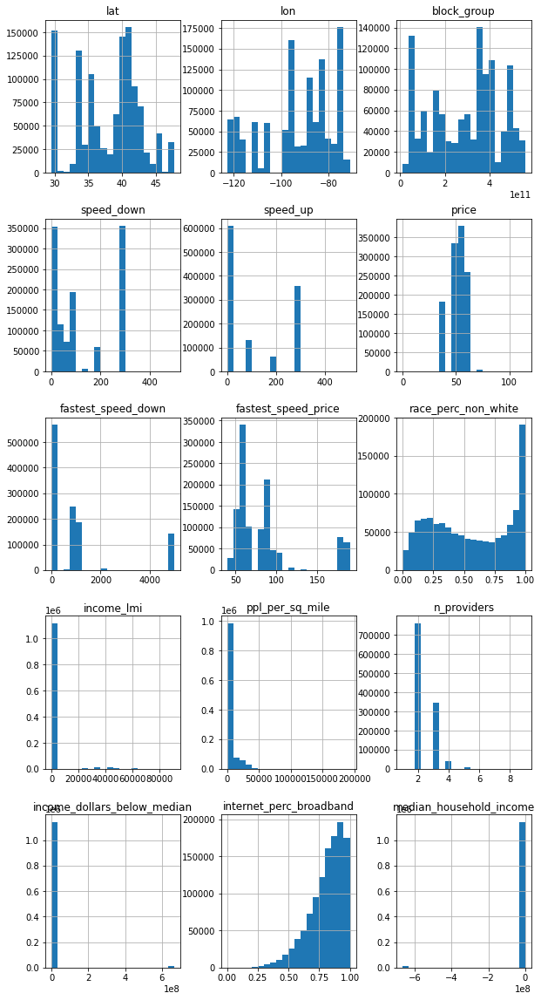

In [ ]:
numerical_columns_df = pd.DataFrame(numerical_columns,columns = ['columns'])
fig, axis = plt.subplots(5,3,figsize=(10, 20))
final_merged_df.hist(ax=axis,bins = 20)

### Key takwaways:
* We can see two different trends in downloading speed of cheapest plan (down_speed) - Either people go for high speeds like 300mbps or go for cheap plans like 50mbps
* Fastest download speed - People generally go for speeds around 1000mbps, some people go for 4000mbps
* Price - our dependent variable demonstrates normal distribution curve with mean around 55usd 
* Income features show that there is a very small section of people who have outrageously high income. These are potential outliers

### There is a huge scale difference among different fetures, so we may need to scale the data or perform some sort of transformation to achieve normal distribution

### Relationship of continuous variables vs price

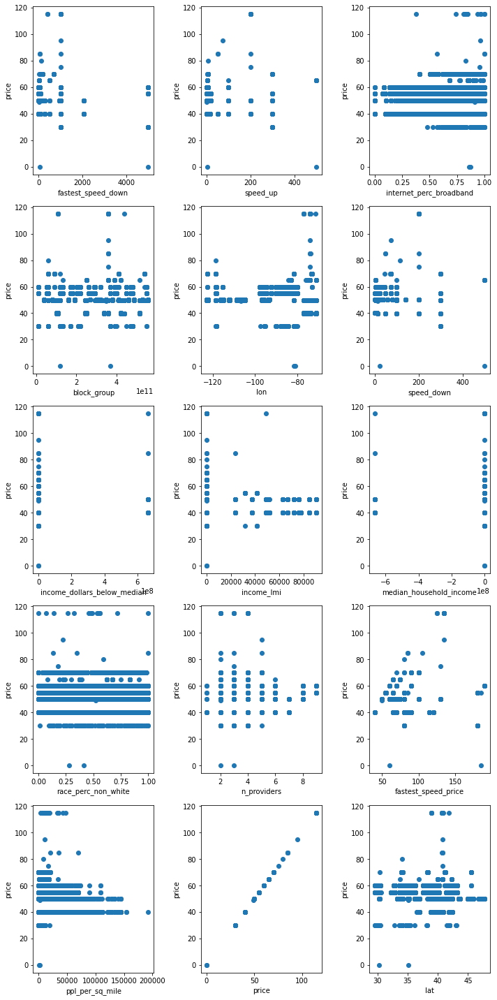

In [ ]:
numerical_columns_df = pd.DataFrame(numerical_columns,columns = ['columns'])
fig, axis = plt.subplots(5,3,figsize=(10, 20))
c=1
for i in numerical_columns_df['columns']:
    plt.subplot(5, 3, c)
    plt.scatter(final_merged_df[i], final_merged_df['price'])
    plt.xlabel(i)
    plt.ylabel("price")
    c = c + 1
fig.tight_layout()
plt.show()

* No specific linear trends seen. 
* But we can see that price range is usually 40-80usd

### Taking a look at different categories of categorica variables - countplot

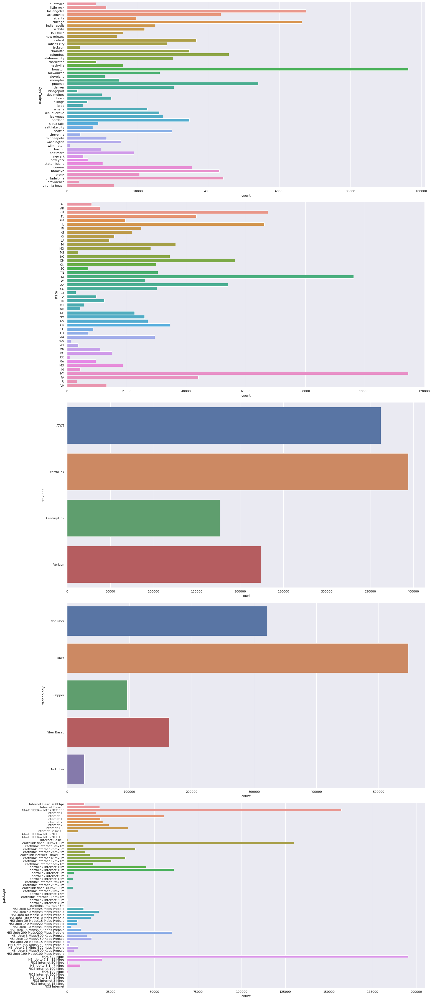

In [ ]:
categorical_columns_df = pd.DataFrame(categorical_columns,columns = ['columns'])
categorical_df = final_merged_df[list(categorical_columns_df['columns'].values)]
sns.set(font_scale = 1)

c = 1
plt.figure(figsize = (20,50))
for i in categorical_df.columns:
  plt.subplot(5, 1, c)
  plt.tight_layout()
  sns.countplot(data= categorical_df, y=i)

  c = c+1

### Market share of each provider in different states

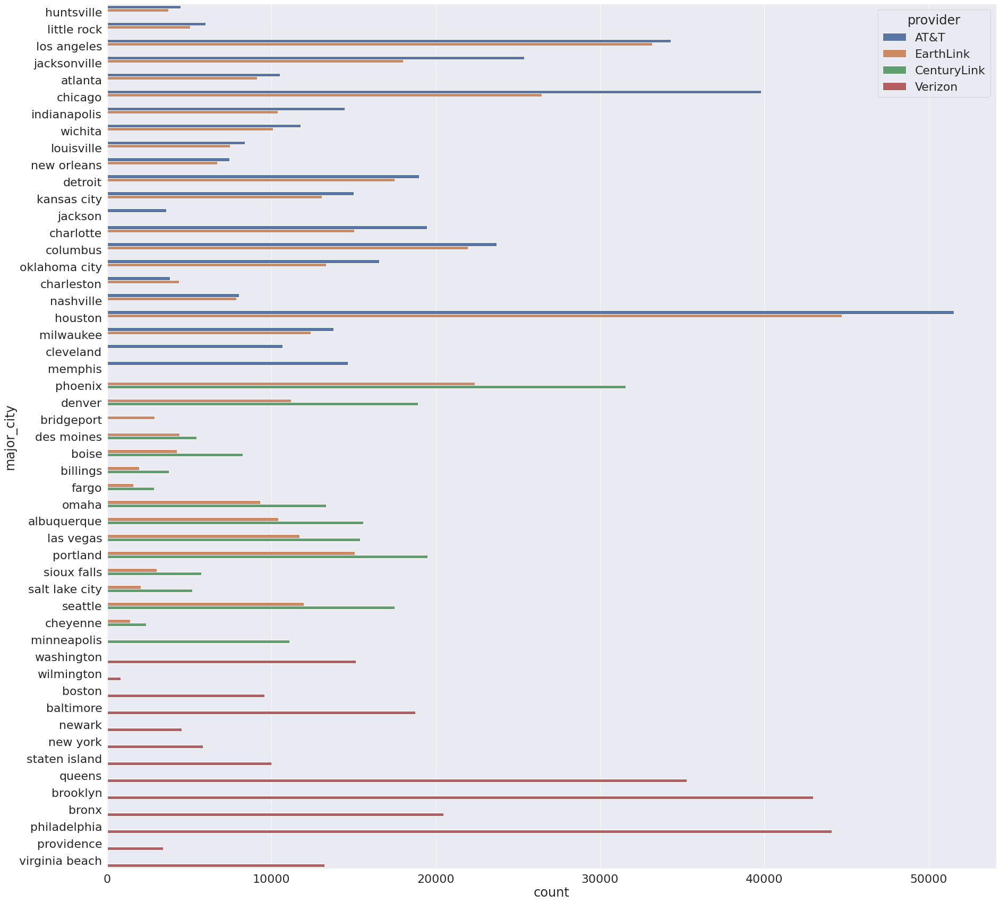

In [ ]:
plt.figure(figsize = (30,30))
sns.set(font_scale = 2)

sns.countplot(data = final_merged_df,y = 'major_city',hue='provider')

As we can see verizon has monopoly in the regions where it exists since no other providers exist. One may feel that it's in conflict with reality!

However there is a proper reason behind this observation. 
The Verizon dataset has the finest combination of Fiber, DSL, Copper, and Cable Internet in North East America, which is the reason for this. In addition, Verizon ISP continues to use both GSM and CDMA, in contrast to other ISPs who have discontinued doing so.

We also read that verizon hands out contracts to other providers. Hence, they are leading provider in our dataset

Market share of each provider in different states

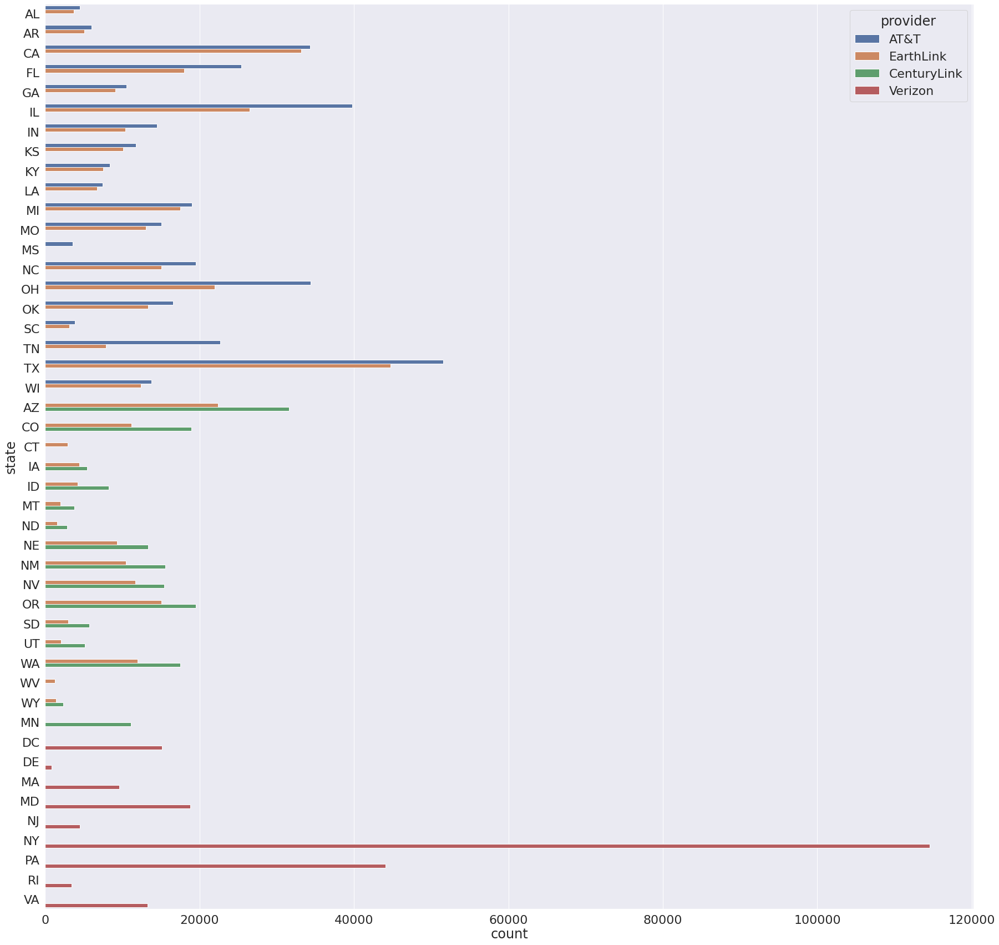

In [ ]:
plt.figure(figsize = (30,30))
sns.set(font_scale = 2)

sns.countplot(data = final_merged_df,y = 'state',hue='provider')
plt.legend(title='provider')


### Tracking average  average download speed (cheap plans, expensive plans) for different providers

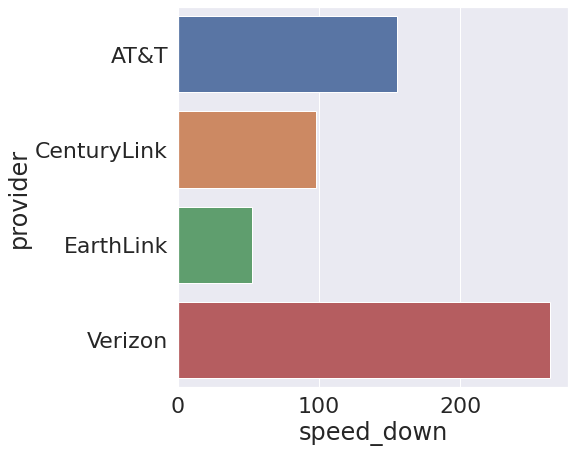

In [ ]:
provider_download = pd.DataFrame(final_merged_df.groupby('provider')['speed_down'].mean()).reset_index()
plt.figure(figsize = (7,7))
sns.barplot(data = provider_download, y = 'provider',x='speed_down')


### As seen verizon has average highest download speed and Earthlink has lowest average download speed when it comes to cheapest plans 

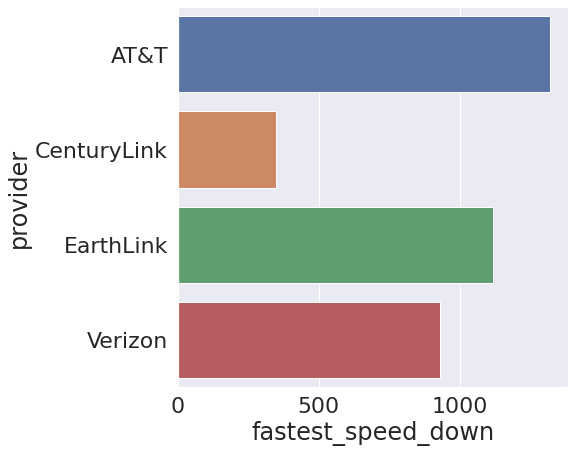

In [ ]:
provider_fastdownload = pd.DataFrame(final_merged_df.groupby('provider')['fastest_speed_down'].mean()).reset_index()
plt.figure(figsize = (7,7))
sns.barplot(data = provider_fastdownload, y = 'provider',x='fastest_speed_down')


### Surprisingly, when it comes to expensive plans,centurylink has lowest download speed and AT&T has highest average download speed. We can see earthlink dominates expensive plans category compared to other providers despite earthlink wasn't good when it came to cheaper plans

## Heatmap

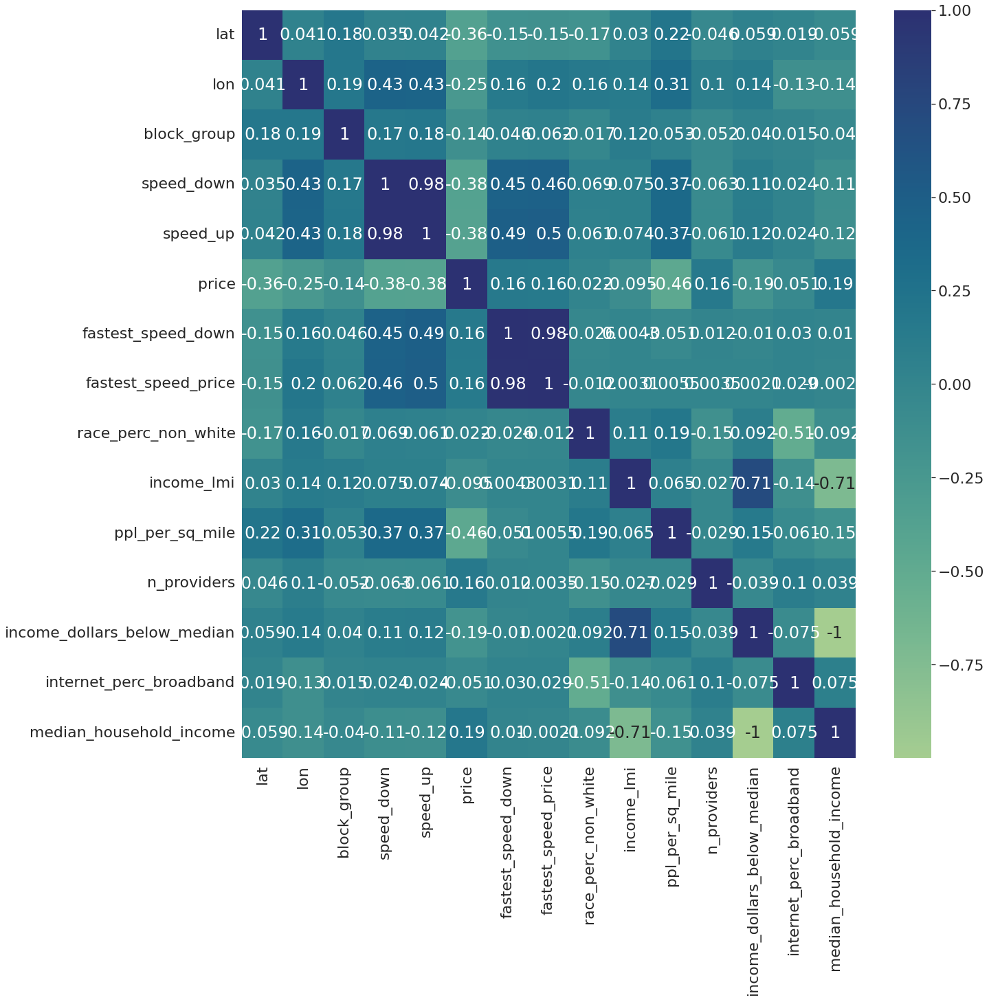

In [ ]:
plt.figure(figsize = (22,22))
sns.heatmap(final_merged_df.corr(),annot=True,cmap = "crest")

### As we can see no one of the features is strongly correlated to our dependent variable price. This means that there is no problem of multicolinearity - This is a good sign

## Seeing which cities are covered in the data across diff providers

In [ ]:
final_merged_df.state.nunique()

46

## AT&T, centurylink,earthlink, verizon covers 46 states in total

In [ ]:
!pip install plotly-express


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
unique_states = pd.DataFrame(final_merged_df.state.unique(),columns = ['state'])


In [ ]:
import plotly.express as px
fig = px.choropleth(unique_states,
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='state',
                    color_continuous_scale="Viridis_r", 
                    
                    )
fig.show()

## We have data for almost all USA states except Maine, vermont, Alaska, new hampshire -> Good data

## Plotting each lat long in USA with different providers

In [ ]:
px.set_mapbox_access_token("pk.eyJ1IjoieWFzaGFnODA4IiwiYSI6ImNsYjJ1NXRmeDA2OWEzcHFuc2ZnczNsaGgifQ.xx3aefW-L8CN5dbP7xIsWA")
fig = px.scatter_mapbox(att_cleaned_df, lat="lat", lon="lon",color="package", size="price",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=20,zoom=12)
fig.show()

### Visualization over

## Now we proceed to next step of our pipeline - Feature Engineering

### Handing rare categorical data

#### As we saw from above bar plots, there is no categorical feature which contains extremely rare values so we don't need to do any imputation/subsitution.

### Outlier analysis

In [ ]:
numerical_data = final_merged_df[numerical_columns_df['columns'].values.tolist()]
outlier_ratio = []

lowers=[]
uppers = []

for col in numerical_data.columns:
  q1 = final_merged_df[col].quantile(0.25)
  q3 = final_merged_df[col].quantile(0.75)
  iqr = q3-q1
  lower = q1 - 1.5*iqr
  upper = q3 + 1.5*iqr
  lowers.append(lower)
  uppers.append(upper)
  outliers = final_merged_df[(final_merged_df[col]<lower) | ((final_merged_df[col]>upper))]

  outlier_ratio.append(outliers.shape[0]/final_merged_df.shape[0])





In [ ]:
outratio = pd.DataFrame()
outratio['column'] = ""
outratio['outlier_ratio'] = ""
outratio['column'] = numerical_data.columns.tolist()
outratio['outlier_ratio'] = outlier_ratio
outratio

,column,outlier_ratio
0,fastest_speed_down,0.122636
1,speed_up,0.000000
2,internet_perc_broadband,0.022530
3,block_group,0.000000
4,lon,0.000000
5,speed_down,0.000000
6,income_dollars_below_median,0.054414
7,income_lmi,0.064515
8,median_household_income,0.050657
9,race_perc_non_white,0.000000


### Since the outlier percentage is not much large, we can replace these outliers with median values. We dont use mean since means are inherently susceptible to outliers. But we need to explore price outliers since price is a dependent variable.

#### If the outliers of price seems legit, we may keep the outliers in price

In [ ]:
final_merged_df['price'].min()

30.0

In [ ]:
# There are rows where price is 0. drop these 2 rows as they were not handled in the cleaning stage
final_merged_df.drop(final_merged_df[final_merged_df['price'] == final_merged_df['price'].min()].index,axis=0,inplace=True)

#### checking the lower range of spectrum of outliers

In [ ]:
final_merged_df[(final_merged_df['price']<lowers[9])].shape[0]/final_merged_df.shape[0]

0.0

In [ ]:
final_merged_df['price'].min()

39.99

#### out of 16.03% of outlier rows, 15.7% rows have outliers in the lower range i.e price< 42.37 usd. This is normal as those prices have a range of 30-40 usd. These could be possible values of cheap plan prices. They are not insanely low for it to be considered abnormal

In [ ]:
final_merged_df[(final_merged_df['price']>uppers[9])].shape[0]/final_merged_df.shape[0]

1.0

### Very low proportion of outliers lie in upper range of spectrum

In [ ]:
final_merged_df['price'].max()

114.99

In [ ]:
final_merged_df[final_merged_df['price'] == final_merged_df['price'].max()]


,major_city,state,lat,lon,block_group,provider,speed_down,speed_up,price,technology,package,fastest_speed_down,fastest_speed_price,race_perc_non_white,income_lmi,ppl_per_sq_mile,n_providers,income_dollars_below_median,internet_perc_broadband,median_household_income
933483,washington,DC,38.900965,-77.015924,110010047021,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.477222,1.311343,11031.101578,4.0,-28283.0,0.934000,119125
939869,washington,DC,38.924591,-77.036000,110010037002,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.719562,0.469816,18346.551551,3.0,48163.0,0.840513,42679
943496,washington,DC,38.932924,-77.082854,110010008011,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.264272,0.997226,7733.134921,2.0,252.0,0.959225,90590
943684,washington,DC,38.900107,-77.016883,110010059001,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.491836,1.087052,3910.843362,4.0,-7908.0,0.825796,98750
983450,new york,NY,40.774987,-73.958552,360610140002,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.068860,2.407556,42823.590814,4.0,-94371.0,0.809357,161417
984378,new york,NY,40.764776,-73.991500,360610133003,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.456740,1.544507,34198.032065,4.0,-36507.0,0.837940,103553
985597,new york,NY,40.811140,-73.961141,360610203001,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,400.0,124.99,0.556639,0.787713,47875.177809,3.0,14233.0,0.740525,52813
986378,new york,NY,40.776416,-73.959642,360610140005,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,400.0,124.99,0.000000,3.728798,32869.915758,4.0,-182955.0,1.000000,250001
1037467,brooklyn,NY,40.685325,-73.967031,360470199001,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.323529,2.346896,13081.325446,2.0,-90304.0,1.000000,157350
1053797,brooklyn,NY,40.705195,-73.930643,360470453002,Verizon,200.0,200.0,114.99,Fiber,FiOS Internet 200 Mbps,1024.0,134.99,0.548881,0.784745,7418.086501,2.0,14432.0,0.846797,52614


### All these plans belong to verizon FiOS 200mbps. So this is probably verizon's high speed plan and its natural to be expensive. This price value is not abnormal and hence should not be changed in outlier handling process

### We will keep outlier values for price - dependent variable. No substitution. Do substitution for other columns

In [ ]:
col = list(set(numerical_data.columns) - set(['price']))
final_merged_df['was_outlier'] = ""
for i in range(len(col)):
  print("outliers of "+col[i]+" handled")
  final_merged_df['was_outlier'].loc[final_merged_df[(final_merged_df[col[i]]<lower) | ((final_merged_df[col[i]]>upper))].index] = 1
  final_merged_df[col] = final_merged_df[col[i]].loc[final_merged_df[(final_merged_df[col[i]]<lower) | ((final_merged_df[col[i]]>upper))].index] = final_merged_df[col[i]].median()


outliers of fastest_speed_down handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of block_group handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of speed_up handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of internet_perc_broadband handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of lon handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of speed_down handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of income_dollars_below_median handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of income_lmi handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of median_household_income handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of race_perc_non_white handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of n_providers handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of fastest_speed_price handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of ppl_per_sq_mile handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



outliers of lat handled


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Checking outratio

In [ ]:
numerical_data = final_merged_df[numerical_columns_df['columns'].values.tolist()]
outlier_ratio = []

for col in numerical_data.columns:
  q1 = final_merged_df[col].quantile(0.25)
  q3 = final_merged_df[col].quantile(0.75)
  iqr = q3-q1
  lower = q1 - 1.5*iqr
  upper = q3 + 1.5*iqr
  outliers = final_merged_df[(final_merged_df[col]<lower) | ((final_merged_df[col]>upper))]

  outlier_ratio.append(outliers.shape[0]/final_merged_df.shape[0])


In [ ]:
outratio = pd.DataFrame()
outratio['column'] = ""
outratio['outlier_ratio'] = ""
outratio['column'] = numerical_data.columns.tolist()
outratio['outlier_ratio'] = outlier_ratio
outratio

,column,outlier_ratio
0,fastest_speed_down,0.000000
1,speed_up,0.000000
2,internet_perc_broadband,0.000000
3,block_group,0.000000
4,lon,0.000000
5,speed_down,0.000000
6,income_dollars_below_median,0.000000
7,income_lmi,0.000000
8,median_household_income,0.000000
9,race_perc_non_white,0.000000


### we added 1 to column "was outlier" for rows where we handled outliers. Lets put 0 for other rows in this column

In [ ]:
final_merged_df['was_outlier'] = np.where(final_merged_df['was_outlier'] == 1,1,0)

In [ ]:
final_merged_df['was_outlier'].value_counts()

1    1156579
Name: was_outlier, dtype: int64

### As seen outliers have been handled

## *Encoding categorical variables*

#### We will check number of categories for each categorical variable and decide our encoding method accordingly

In [ ]:
for feature in categorical_df.columns:
  print('The feature is {} and number of categories are {}'.format(feature,final_merged_df[feature].nunique()))

The feature is major_city and number of categories are 51
The feature is state and number of categories are 46
The feature is provider and number of categories are 4
The feature is technology and number of categories are 5
The feature is package and number of categories are 62


## Since there are large number of categories overall, we cant use one hot encoding. 
* We could have gone for target encoding but they are generally found to be prone to overfit
* Since we saw from our bar plots that there are hardly any rare categorical data, we can opt for frequency encoding i.e assigning each category, the number of times they appeared in the dataset

### Frequency encoding

In [ ]:
final_merged_df_copy = final_merged_df.copy()

In [ ]:
for feature in categorical_df.columns:
  df = pd.DataFrame(final_merged_df_copy[feature].value_counts())
  df[feature] = df[feature].astype(float)
  dict = df.to_dict()
  dict = dict[feature]
  final_merged_df_copy[feature] = final_merged_df_copy[feature].apply(lambda x: dict.get(x))


In [ ]:
final_merged_df_copy

,major_city,state,lat,lon,block_group,provider,speed_down,speed_up,price,technology,...,fastest_speed_down,fastest_speed_price,race_perc_non_white,income_lmi,ppl_per_sq_mile,n_providers,income_dollars_below_median,internet_perc_broadband,median_household_income,was_outlier
0,8179.0,8179.0,940.0,940.0,940.0,362211.0,940.0,940.0,55.0,321203.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
1,8179.0,8179.0,940.0,940.0,940.0,362211.0,940.0,940.0,55.0,321203.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
2,8179.0,8179.0,940.0,940.0,940.0,362211.0,940.0,940.0,55.0,321203.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
3,8179.0,8179.0,940.0,940.0,940.0,362211.0,940.0,940.0,55.0,321203.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
4,8179.0,8179.0,940.0,940.0,940.0,362211.0,940.0,940.0,55.0,547252.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1156663,13231.0,13231.0,940.0,940.0,940.0,224075.0,940.0,940.0,40.0,27454.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
1156664,13231.0,13231.0,940.0,940.0,940.0,224075.0,940.0,940.0,40.0,27454.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
1156665,13231.0,13231.0,940.0,940.0,940.0,224075.0,940.0,940.0,40.0,27454.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1
1156666,13231.0,13231.0,940.0,940.0,940.0,224075.0,940.0,940.0,40.0,27454.0,...,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,940.0,1


## *Modeling stage*

In [ ]:
X = final_merged_df_copy.drop('price',axis=1)
y = final_merged_df_copy['price']

#### X shape =11,56,666 rows

## Train test splitting

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25, random_state = 100)

In [ ]:
X_train.shape

(867434, 20)

In [ ]:
X_test.shape

(289145, 20)

#### Train rows - 8,67,499 rows

#### Test rows - 2,89,167 rows

#### Scaling our data for future rows. We can use scaled versions of data for some models like Linear regression with regularization, Distance based models etc

In [ ]:
from sklearn.preprocessing import StandardScaler


In [ ]:
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)


### Testing out models
### We will be taking R2,MAE,RMSE as our metrics

In [ ]:
from sklearn.metrics import r2_score,mean_absolute_error
from sklearn.metrics import mean_squared_error
from math import sqrt



In [ ]:
result = pd.DataFrame(columns = ['Model Name','R2 score', 'MAE','RMSE'])
result['Model Name'] = ""
result['R2 score'] = ""
result['MAE'] = ""
result['RMSE'] = ""

### 1. Baseline linear regression

In [ ]:
from sklearn.linear_model import LinearRegression


In [ ]:
lr_baseline = LinearRegression()
lr_baseline.fit(X_train,y_train)
y_pred_lr_baseline = lr_baseline.predict(X_test)
r2_linear_baseline = r2_score(y_test,y_pred_lr_baseline)
mae_linear_baseline =  mean_absolute_error(y_test,y_pred_lr_baseline)
rmse_linear_baseline =  sqrt(mean_squared_error(y_test,y_pred_lr_baseline))

  
print("R2: " + str(r2_linear_baseline))
print("MAE: ", str(mae_linear_baseline))
print("RMSE: ", str(rmse_linear_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline Linear Regression'], 'R2 score':str(r2_linear_baseline),'MAE':str(mae_linear_baseline),'RMSE': str(rmse_linear_baseline)}))



R2: 0.785477946503195
MAE:  2.414084156349595
RMSE:  2.996457816749097


### coefficients

In [ ]:
coeff=[]
coeff.append(lr_baseline.coef_)

print("coefficients of linear model : " + str(lr_baseline.coef_))
print("\n")
print("Intercepts of linear model : " + str(lr_baseline.intercept_))
print("\n")

coefficients of linear model : [ 3.05899734e-05 -1.86297347e-05  5.08219768e-20 -5.42101086e-20
  0.00000000e+00  5.92877013e-05  0.00000000e+00  0.00000000e+00
  2.67642166e-05 -7.17406146e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]


Intercepts of linear model : 29.31300788989462




In [ ]:
compare_df = pd.DataFrame(columns = ['y_test','y_pred','residual'])
compare_df['y_test'] = y_test
compare_df['y_pred'] = y_pred_lr_baseline
compare_df['residual'] = np.abs(y_test - y_pred_lr_baseline)
compare_df

,y_test,y_pred,residual
410005,59.95,54.991178,4.958822
423268,59.95,54.991178,4.958822
622007,54.95,55.581335,0.631335
249770,55.00,54.529321,0.470679
504750,59.95,58.298833,1.651167
...,...,...,...
673961,49.95,52.112310,2.162310
901503,50.00,50.531142,0.531142
630740,54.95,55.581335,0.631335
378121,49.95,52.652925,2.702925


In [ ]:
compare_df['residual'].mean()

2.414084156349595

### On an average our predictions vary from actual price by 2.4 usd, also demonstrated by MAE

### Compare actual price vs predictions made by the linear regression model

Text(0.5, 1.0, 'Linear Regression Model')

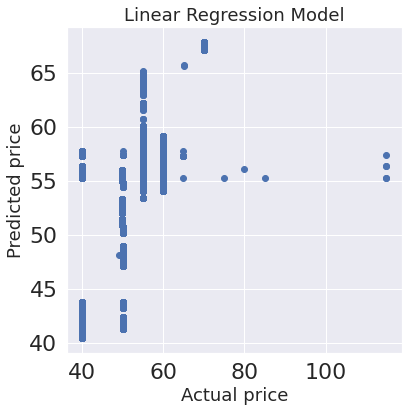

In [ ]:
plt.rcParams['agg.path.chunksize'] = 1000000
# set no of points
plt.figure(figsize = (6,6))
plt.scatter(y_test,y_pred_lr_baseline)
plt.xlabel("Actual price",fontsize = 18)
plt.ylabel("Predicted price",fontsize = 18)
plt.title("Linear Regression Model",fontsize = 18)

### As we can see the model performs really bad on outliers.

### Testing linearity by plotting predicted values vs residuals

Text(0, 0.5, ' Residual :(Predicted pice - actual price)')

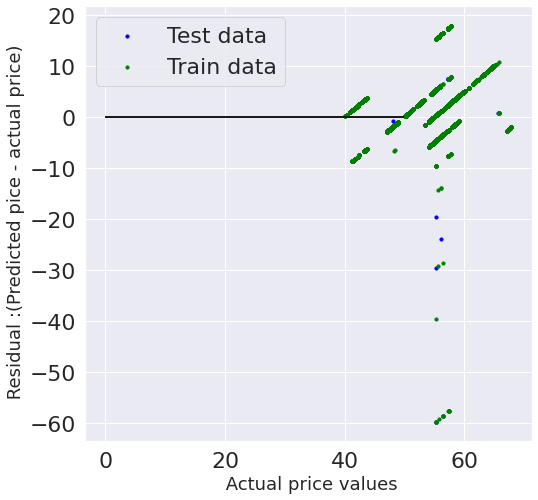

In [ ]:
## plotting residual errors in test data
plt.figure(figsize = (8,8))

plt.scatter(y_pred_lr_baseline, (y_pred_lr_baseline - y_test),color = "blue", s = 10, label = "Test data")
## plotting residual errors in train data
plt.scatter(lr_baseline.predict(X_train), lr_baseline.predict(X_train) - y_train,
            color = "green", s = 10, label = 'Train data')
#plotting zero residual error
plt.hlines(y = 0, xmin = 0, xmax = 50, linewidth = 2)

plt.legend()
plt.xlabel(" Actual price values",fontsize = 18)
plt.ylabel(" Residual :(Predicted pice - actual price)", fontsize = 18)

###From the above figure, we see that
* If the points are projected on y axis, the curve follows normal distribution to some extent but not entirely. Hence saying that residuals are normally distributed will be a gray area
*The density of some points are close to origin but alot of points are still too farther away from origin

#### Overall linear regression model is not that good because we dont see perfect results in the above 2 observations made. Also we got a mediocre R2 score. Hence the model is not able to explain a good proportion of the variance in the data

### Polynomial regression

In [ ]:

from sklearn.preprocessing import PolynomialFeatures

poly =PolynomialFeatures(degree=2,include_bias=False)

X_train_poly = poly.fit_transform(X_train)
X_test_poly= poly.transform(X_test)

lr_poly=LinearRegression(fit_intercept=False)

In [ ]:

lr_poly.fit(X_train_poly,y_train)



y_pred_poly = lr_poly.predict(X_test_poly)

r2_poly = r2_score(y_test,y_pred_poly)
mae_poly =  mean_absolute_error(y_test,y_pred_poly)
rmse_poly =  sqrt(mean_squared_error(y_test,y_pred_poly))

  
print("R2: " + str(r2_poly))
print("MAE: ", str(mae_poly))
print("RMSE: ", str(rmse_poly))

result = result.append(pd.DataFrame({'Model Name':['Polynomial Regression'], 'R2 score':str(r2_poly),'MAE':str(mae_poly),'RMSE': str(rmse_poly)}))


R2: 0.8667133741693545
MAE:  1.59434274038019
RMSE:  2.3619216245648427


### Polynomial with degree 2 results
* R2: 0.8650912532959002
* MAE: 1.597381344022649
* RMSE: 2.3743890056763917

Text(0.5, 1.0, 'Polynomial Regression Model')

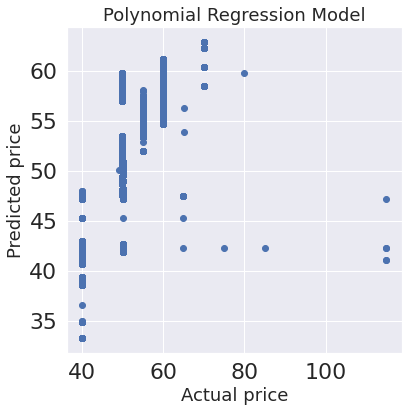

In [ ]:
plt.rcParams['agg.path.chunksize'] = 1000000
# set no of points
plt.figure(figsize = (6,6))

plt.scatter(y_test,y_pred_poly)
plt.xlabel("Actual price",fontsize = 18)
plt.ylabel("Predicted price",fontsize = 18)
plt.title("Polynomial Regression Model",fontsize = 18)

In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427


### Ridge regression

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

### Baseline model

##### Ideally ridge should be implemented upon scaled features

In [ ]:
ridge_baseline_scaled =Ridge()
ridge_baseline_scaled.fit(X_train_scaled,y_train)
y_pred_ridge_baseline_scaled = ridge_baseline_scaled.predict(X_test_scaled)

r2_ridge_baseline_scaled = r2_score(y_test,y_pred_ridge_baseline_scaled)
mae_ridge_baseline_scaled = mean_absolute_error(y_test,y_pred_ridge_baseline_scaled) 
rmse_ridge_baseline_scaled =  sqrt(mean_squared_error(y_test,y_pred_ridge_baseline_scaled))

print("R2: " + str(r2_ridge_baseline_scaled))
print("MAE: ", str(mae_ridge_baseline_scaled))
print("RMSE: ", str(rmse_ridge_baseline_scaled))

result = result.append(pd.DataFrame({'Model Name':['Baseline Ridge Regression on scaled features '], 'R2 score':str(r2_ridge_baseline_scaled),'MAE':str(mae_ridge_baseline_scaled),'RMSE': str(rmse_ridge_baseline_scaled)}))


R2: 0.7854779461764777
MAE:  2.4140872314299027
RMSE:  2.9964578190309012


In [ ]:
ridge_baseline_scaled.get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'normalize': 'deprecated',
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.001}

#### By default ridge regression used alpha = 1. It gave similar result as linear regression

In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012


#### Baseline ridge regression gives almost similar results as linear model

#### Lets try implementing Ridge regression grid search

##### Grid search with 5 folds

In [ ]:

ridge_grid =Ridge()
parameters={'alpha':[1e-5,1e-3,1e-2,0.1,1,5,10,20,30,35,40,45,50,55,100]}

ridge_finalized = GridSearchCV(ridge_grid,parameters,scoring='r2',cv=5,verbose=1,n_jobs=-1)

ridge_finalized.fit(X_train_scaled,y_train)
y_pred_ridge_finalized = ridge_finalized.predict(X_test_scaled)

r2_ridge_finalized = r2_score(y_test,y_pred_ridge_finalized)
mae_ridge_finalized = mean_absolute_error(y_test,y_pred_ridge_finalized) 
rmse_ridge_finalized =  sqrt(mean_squared_error(y_test,y_pred_ridge_finalized))

print("R2: " + str(r2_ridge_finalized))
print("MAE: ", str(mae_ridge_finalized))
print("RMSE: ", str(rmse_ridge_finalized))

result = result.append(pd.DataFrame({'Model Name':[' Ridge Regression Grid search on scaled features, 5 folds '], 'R2 score':str(r2_ridge_finalized),'MAE':str(mae_ridge_finalized),'RMSE': str(rmse_ridge_finalized)}))


Fitting 5 folds for each of 15 candidates, totalling 75 fits
R2: 0.7854779461764777
MAE:  2.4140872314299027
RMSE:  2.9964578190309012


In [ ]:
ridge_finalized.best_params_  


{'alpha': 1}

#### On trying grid search cv for 5 folds, best value of alpha = 1, which is the default case. So it gave same accuracy as before

#### Grid search with 20 folds

In [ ]:
ridge_grid =Ridge()
parameters={'alpha':[1e-5,1e-3,1e-2,0.1,1,5,10,20,30,35,40,45,50,55,100]}

ridge_finalized = GridSearchCV(ridge_grid,parameters,scoring='r2',cv=20,verbose=1,n_jobs=-1)

ridge_finalized.fit(X_train_scaled,y_train)
y_pred_ridge_finalized = ridge_finalized.predict(X_test_scaled)

r2_ridge_finalized = r2_score(y_test,y_pred_ridge_finalized)
mae_ridge_finalized = mean_absolute_error(y_test,y_pred_ridge_finalized) 
rmse_ridge_finalized =  sqrt(mean_squared_error(y_test,y_pred_ridge_finalized))

print("R2: " + str(r2_ridge_finalized))
print("MAE: ", str(mae_ridge_finalized))
print("RMSE: ", str(rmse_ridge_finalized))

result = result.append(pd.DataFrame({'Model Name':[' Ridge Regression Grid search on scaled features 20 folds '], 'R2 score':str(r2_ridge_finalized),'MAE':str(mae_ridge_finalized),'RMSE': str(rmse_ridge_finalized)}))


Fitting 20 folds for each of 15 candidates, totalling 300 fits
R2: 0.7854779446496987
MAE:  2.414099531521399
RMSE:  2.9964578296939752


In [ ]:
ridge_finalized.best_params_  
#ridge_finalized.best_score_ 

{'alpha': 5}

#### On trying grid search cv for 20 folds, best value of alpha = 5, but the accuracy still remains similar.

In [ ]:
pd.set_option('display.max_colwidth', None)
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
0,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
0,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752


## Lasso regression

#### Baseline model on scaled features

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:

lasso_baseline_scaled =Lasso()
lasso_baseline_scaled.fit(X_train_scaled,y_train)
y_pred_lasso_baseline_scaled = lasso_baseline_scaled.predict(X_test_scaled)

r2_lasso_baseline_scaled = r2_score(y_test,y_pred_lasso_baseline_scaled)
mae_lasso_baseline_scaled = mean_absolute_error(y_test,y_pred_lasso_baseline_scaled) 
rmse_lasso_baseline_scaled =  sqrt(mean_squared_error(y_test,y_pred_lasso_baseline_scaled))

print("R2: " + str(r2_lasso_baseline_scaled))
print("MAE: ", str(mae_lasso_baseline_scaled))
print("RMSE: ", str(rmse_lasso_baseline_scaled))

result = result.append(pd.DataFrame({'Model Name':['Baseline Lasso Regression on scaled features '], 'R2 score':str(r2_lasso_baseline_scaled),'MAE':str(mae_lasso_baseline_scaled),'RMSE': str(rmse_lasso_baseline_scaled)}))


R2: 0.5326991406015515
MAE:  3.6065146432372046
RMSE:  4.422526921397267


In [ ]:
lasso_baseline_scaled.get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': 1000,
 'normalize': 'deprecated',
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

#### Alpha = 1 has been chosen by default


#### Lasso regression did not perform well opposed to linear or ridge

#### Lasso regression grid search with 20 folds

In [ ]:
lasso_grid =Lasso()
parameters={'alpha':[1e-5,1e-3,1e-2,0.1,1,5,10,20,30,35,40,45,50,55,100]}

lasso_finalized = GridSearchCV(lasso_grid,parameters,scoring='r2',cv=20,verbose=1,n_jobs=-1)

lasso_finalized.fit(X_train_scaled,y_train)
y_pred_lasso_finalized = lasso_finalized.predict(X_test_scaled)

r2_lasso_finalized = r2_score(y_test,y_pred_lasso_finalized)
mae_lasso_finalized = mean_absolute_error(y_test,y_pred_lasso_finalized) 
rmse_lasso_finalized =  sqrt(mean_squared_error(y_test,y_pred_lasso_finalized))

print("R2: " + str(r2_lasso_finalized))
print("MAE: ", str(mae_lasso_finalized))
print("RMSE: ", str(rmse_lasso_finalized))

result = result.append(pd.DataFrame({'Model Name':[' Lasso Regression Grid search on scaled features 20 folds '], 'R2 score':str(r2_lasso_finalized),'MAE':str(mae_lasso_finalized),'RMSE': str(rmse_lasso_finalized)}))


Fitting 20 folds for each of 15 candidates, totalling 300 fits
R2: 0.7854779211932397
MAE:  2.414093169388218
RMSE:  2.996457993514633


In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
0,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
0,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752
0,Baseline Lasso Regression on scaled features,0.5326991406015515,3.6065146432372046,4.422526921397267
0,Lasso Regression Grid search on scaled features 20 folds,0.7854779211932397,2.414093169388218,2.996457993514633


#### Grid search helped lasso reach the peak as linear, ridge. But no improvement over that !

#### Elastic net regression

In [ ]:
from sklearn.linear_model import ElasticNet


In [ ]:
elasticnet_baseline_scaled = ElasticNet(random_state=0,alpha=1.0, l1_ratio=0.5)

elasticnet_baseline_scaled.fit(X_train_scaled,y_train)
y_pred_elastic_baseline_scaled = elasticnet_baseline_scaled.predict(X_test_scaled)

r2_elasticnet_baseline_scaled = r2_score(y_test,y_pred_elastic_baseline_scaled)
mae_elasticnet_baseline_scaled = mean_absolute_error(y_test,y_pred_elastic_baseline_scaled) 
rmse_elasticnet_baseline_scaled =  sqrt(mean_squared_error(y_test,y_pred_elastic_baseline_scaled))

print("R2: " + str(r2_elasticnet_baseline_scaled))
print("MAE: ", str(mae_elasticnet_baseline_scaled))
print("RMSE: ", str(rmse_elasticnet_baseline_scaled))

result = result.append(pd.DataFrame({'Model Name':['Baseline Elasticnet Regression on scaled features '], 'R2 score':str(r2_elasticnet_baseline_scaled),'MAE':str(mae_elasticnet_baseline_scaled),'RMSE': str(rmse_elasticnet_baseline_scaled)}))

R2: 0.5147539224408982
MAE:  3.553359597250637
RMSE:  4.506643580906438


#### elastic net gives bad initial accuracy just like lasso. Lets try to do hyper parameter tuning and see if the results are any different

#### Grid search with folds = 5

In [ ]:
elasticnet_grid =ElasticNet(random_state=0)
parameters={'l1_ratio':np.arange(0.1, 1.0, 0.1),'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}

elasticnet_finalized = GridSearchCV(elasticnet_grid,parameters,scoring='r2',cv=5,verbose=1,n_jobs=-1)
#elasticnet_finalized = GridSearchCV(elasticnet_grid,parameters,scoring='r2',cv=20,verbose=1,n_jobs=-1)


elasticnet_finalized.fit(X_train_scaled,y_train)
y_pred_elasticnet_finalized = elasticnet_finalized.predict(X_test_scaled)

r2_elasticnet_finalized = r2_score(y_test,y_pred_elasticnet_finalized)
mae_elasticnet_finalized = mean_absolute_error(y_test,y_pred_elasticnet_finalized) 
rmse_elasticnet_finalized =  sqrt(mean_squared_error(y_test,y_pred_elasticnet_finalized))

print("R2: " + str(r2_elasticnet_finalized))
print("MAE: ", str(mae_elasticnet_finalized))
print("RMSE: ", str(rmse_elasticnet_finalized))

result = result.append(pd.DataFrame({'Model Name':[' Elasticnet Regression Grid search on scaled features 10 folds '], 'R2 score':str(r2_elasticnet_finalized),'MAE':str(mae_elasticnet_finalized),'RMSE': str(rmse_elasticnet_finalized)}))


Fitting 5 folds for each of 63 candidates, totalling 315 fits
R2: 0.7854777099272492
MAE:  2.4141918676693206
RMSE:  2.996459469002642


#### Executed for 20 folds on local system:
* R2: 0.7837431255490017
* MAE: 2.4179530938470646
* RMSE: 3.006192449853415

In [ ]:
result = result.append(pd.DataFrame({'Model Name':[' Elasticnet Regression Grid search on scaled features 20 folds '], 'R2 score':str(0.7837431255490017),'MAE':str( 2.4179530938470646),'RMSE': str(3.006192449853415)}))


In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
0,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
0,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752
0,Baseline Lasso Regression on scaled features,0.5326991406015515,3.6065146432372046,4.422526921397267
0,Lasso Regression Grid search on scaled features 20 folds,0.7854779211932397,2.414093169388218,2.996457993514633
0,Baseline Elasticnet Regression on scaled features,0.5147539224408982,3.553359597250637,4.506643580906438
0,Elasticnet Regression Grid search on scaled features 10 folds,0.7854777099272492,2.4141918676693206,2.996459469002642
0,Elasticnet Regression Grid search on scaled features 20 folds,0.7837431255490017,2.4179530938470646,3.006192449853415


Since we didnt obtain any improvement with 5/20 folds, this model also peaks at same accuracy score like Linear, ridge, lasso

#### Thus we can conclude that all linear, ridge, lasso, elastic net can only deduce patterns upto a certain score. Polynomial model was still better than all these models (R2 ~ 86/87%). We need more complex models to get better results

#### Lets explore tree based models

## Decision Tree Regression

#### Baseline model

In [ ]:
from sklearn.tree import DecisionTreeRegressor


dt_baseline = DecisionTreeRegressor(random_state=101)
dt_baseline.fit(X_train,y_train)
y_pred_dt_baseline = dt_baseline.predict(X_test)
r2_dt_baseline = r2_score(y_test,y_pred_dt_baseline)
mae_dt_baseline = mean_absolute_error(y_test,y_pred_dt_baseline) 
rmse_dt_baseline =  sqrt(mean_squared_error(y_test,y_pred_dt_baseline))

print("R2: " + str(r2_dt_baseline))
print("MAE: ", str(mae_dt_baseline))
print("RMSE: ", str(rmse_dt_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline Decision Tree Regression'], 'R2 score':str(r2_dt_baseline),'MAE':str(mae_dt_baseline),'RMSE': str(rmse_dt_baseline)}))


R2: 0.931434887909494
MAE:  0.569121412008691
RMSE:  1.6940405064199606


* R2: 0.9283102034355679
* MAE: 0.5775936018168274
* RMSE: 1.7308542260464586

In [ ]:
dt_baseline.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 101,
 'splitter': 'best'}

#### Randomized search

### Parameter set 1 Randomized search 5 folds

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_grid1 = {
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [2, 3,4, 6, 8,10],
              'min_samples_leaf':[1,7,9,10],
              'min_samples_split':[2,4,6,8,10,20]
             }

In [ ]:

from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=101)

dt_random1 = RandomizedSearchCV(dt,param_grid1,scoring='r2',cv=5,verbose=1,n_jobs=-1)

dt_random1.fit(X_train,y_train)
y_pred_dt_random1 = dt_random1.predict(X_test)

r2_dt_random1 = r2_score(y_test,y_pred_dt_random1)
mae_dt_random1 = mean_absolute_error(y_test,y_pred_dt_random1) 
rmse_dt_random1 =  sqrt(mean_squared_error(y_test,y_pred_dt_random1))

print("R2: " + str(r2_dt_random1))
print("MAE: ", str(mae_dt_random1))
print("RMSE: ", str(rmse_dt_random1))

result = result.append(pd.DataFrame({'Model Name':[' Decision Tree Regression Randomized 1'], 'R2 score':str(r2_dt_random1),'MAE':str(mae_dt_random1),'RMSE': str(rmse_dt_random1)}))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
R2: 0.9295070042417883
MAE:  0.5776583181179004
RMSE:  1.7176915494905312


* R2: 0.9279395581105945
* MAE: 0.5848683514285525
* RMSE: 1.7353228254336273

#### Parameter set 1 Grid search 5 folds

In [ ]:
#EXECUTED ON LOCAL SYSTEM
"""  
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=101)

dt_grid1 = GridSearchCV(dt,param_grid1,scoring='r2',cv=5,verbose=1,n_jobs=-1)

dt_grid1.fit(X_train,y_train)
y_pred_dt_grid1 = dt_grid1.predict(X_test)

r2_dt_grid1 = r2_score(y_test,y_pred_dt_grid1)
mae_dt_grid1 = mean_absolute_error(y_test,y_pred_dt_grid1) 
rmse_dt_grid1 =  sqrt(mean_squared_error(y_test,y_pred_dt_grid1))

print("R2: " + str(r2_dt_grid1))
print("MAE: ", str(mae_dt_grid1))
print("RMSE: ", str(rmse_dt_grid1))

result = result.append(pd.DataFrame({'Model Name':[' Decision Tree Regression Grid1'], 'R2 score':str(r2_dt_grid1),'MAE':str(mae_dt_grid1),'RMSE': str(rmse_dt_grid1)}))
"""

'  \nfrom sklearn.tree import DecisionTreeRegressor\ndt = DecisionTreeRegressor(random_state=101)\n\ndt_grid1 = GridSearchCV(dt,param_grid1,scoring=\'r2\',cv=5,verbose=1,n_jobs=-1)\n\ndt_grid1.fit(X_train,y_train)\ny_pred_dt_grid1 = dt_grid1.predict(X_test)\n\nr2_dt_grid1 = r2_score(y_test,y_pred_dt_grid1)\nmae_dt_grid1 = mean_absolute_error(y_test,y_pred_dt_grid1) \nrmse_dt_grid1 =  sqrt(mean_squared_error(y_test,y_pred_dt_grid1))\n\nprint("R2: " + str(r2_dt_grid1))\nprint("MAE: ", str(mae_dt_grid1))\nprint("RMSE: ", str(rmse_dt_grid1))\n\nresult = result.append(pd.DataFrame({\'Model Name\':[\' Decision Tree Regression Grid1\'], \'R2 score\':str(r2_dt_grid1),\'MAE\':str(mae_dt_grid1),\'RMSE\': str(rmse_dt_grid1)}))\n'

In [ ]:
result = result.append(pd.DataFrame({'Model Name':['Decision Tree Regression Grid1'], 'R2 score':str(0.9283813838970363),'MAE':str( 0.583581438459767),'RMSE': str(1.7299947341413182)}))


* R2: 0.9283813838970363
* MAE: 0.583581438459767
* RMSE: 1.7299947341413182

In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
0,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
0,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752
0,Baseline Lasso Regression on scaled features,0.5326991406015515,3.6065146432372046,4.422526921397267
0,Lasso Regression Grid search on scaled features 20 folds,0.7854779211932397,2.414093169388218,2.996457993514633
0,Baseline Elasticnet Regression on scaled features,0.5147539224408982,3.553359597250637,4.506643580906438
0,Elasticnet Regression Grid search on scaled features 10 folds,0.7854777099272492,2.4141918676693206,2.996459469002642
0,Elasticnet Regression Grid search on scaled features 20 folds,0.7837431255490017,2.4179530938470646,3.006192449853415


In [ ]:
#dt_randomized1.best_params_  

As seen above decision tree works way better than lienar models. But even with grid search, the R2 score could not be improved

We can also visualize the tree as well

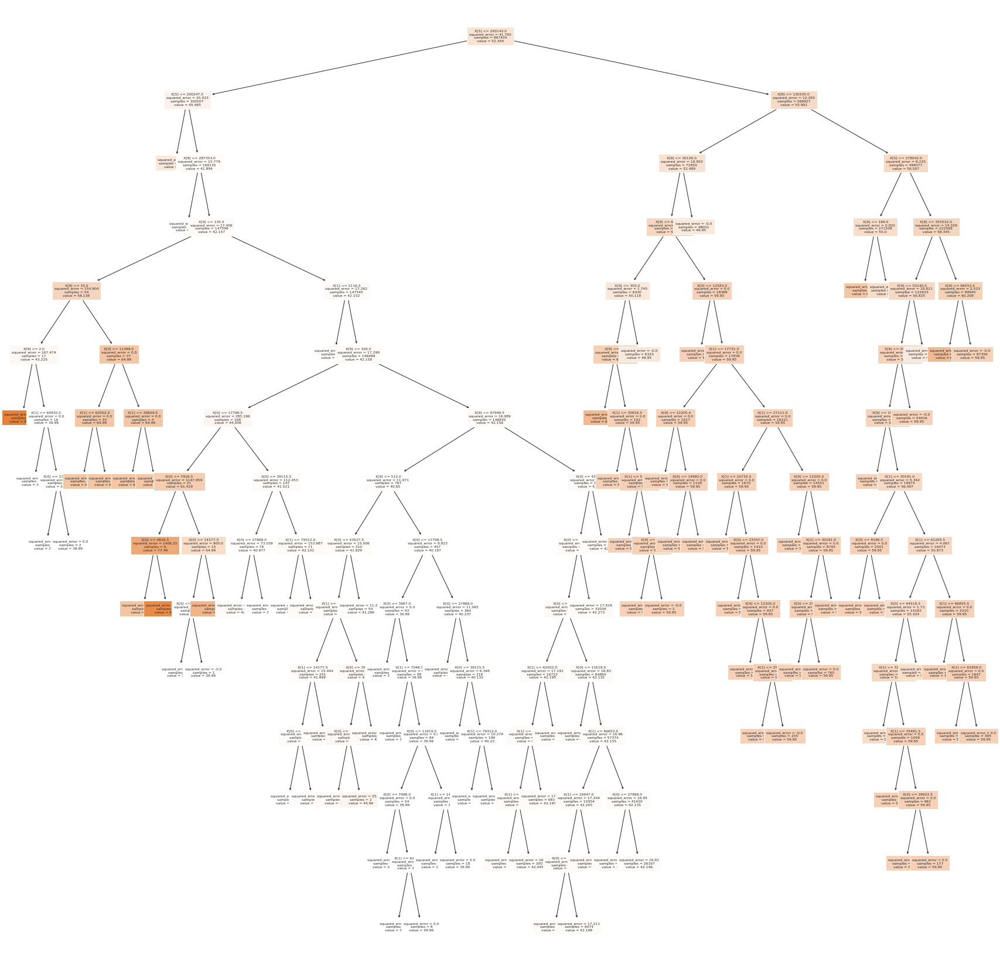

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(30,30))
tree.plot_tree(dt_baseline,filled=True,fontsize=6)
plt.savefig("dt_grid1.png")
plt.show()

### Random Forest

#### Baseline

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf_baseline = RandomForestRegressor(random_state = 101)
rf_baseline.fit(X_train,y_train)  
y_pred_rf_baseline = rf_baseline.predict(X_test)  

r2_rf_baseline = r2_score(y_test,y_pred_rf_baseline)
mae_rf_baseline = mean_absolute_error(y_test,y_pred_rf_baseline) 
rmse_rf_baseline =  sqrt(mean_squared_error(y_test,y_pred_rf_baseline))


print("R2: " + str(r2_rf_baseline))
print("MAE: ", str(mae_rf_baseline))
print("RMSE: ", str(rmse_rf_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline Random Forest Regression'], 'R2 score':str(r2_rf_baseline),'MAE':str(mae_rf_baseline),'RMSE': str(rmse_rf_baseline)}))


R2: 0.9314170828129452
MAE:  0.5691960452432564
RMSE:  1.6942604476987246


#### Randomized search

In [ ]:
param_grid1  = {'n_estimators':[100,300,500,1000,1500,2000,2200],
            'max_depth': [8,10,12,14],  
            'min_samples_split':[6,8,10,20,40], 
            'min_samples_leaf':[9,10,11,12,15],
            'max_features':['sqrt','auto']
            }

In [ ]:
import pickle

In [ ]:
with open('/content/rf_random1.pkl', 'rb') as f:
    rf_random1 = pickle.load(f)

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:329: UserWarning:

Trying to unpickle estimator DecisionTreeRegressor from version 0.22.2.post1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:329: UserWarning:

Trying to unpickle estimator RandomForestRegressor from version 0.22.2.post1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:329: UserWarning:

Trying to unpickle estimator RandomizedSearchCV from version 0.22.2.post1 when using version 1.0.2. This might lead to breaking code or invalid results. Use a

In [ ]:
# EXECUTED LOCALLY ON SYSTEM
"""
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 101)
rf_random1 = RandomizedSearchCV(rf,param_grid1,scoring='r2',cv=5,verbose=1,n_jobs=-1)

rf_random1.fit(X_train,y_train)  
"""
y_pred_rf_random1 = rf_random1.predict(X_test)  

r2_rf_random1 = r2_score(y_test,y_pred_rf_random1)
mae_rf_random1 = mean_absolute_error(y_test,y_pred_rf_random1) 
rmse_rf_random1 =  sqrt(mean_squared_error(y_test,y_pred_rf_random1))


print("R2: " + str(r2_rf_random1))
print("MAE: ", str(mae_rf_random1))
print("RMSE: ", str(rmse_rf_random1))

result = result.append(pd.DataFrame({'Model Name':[' Random Forest Regression Randomized1'], 'R2 score':str(r2_rf_random1),'MAE':str(mae_rf_random1),'RMSE': str(rmse_rf_random1)}))


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:443: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names



R2: 0.9305432495681365
MAE:  0.5711553863432476
RMSE:  1.7050197964267002


* R2: 0.9287028818426813
* MAE: 0.5779949866518411
* RMSE: 1.7261073695423266

In [ ]:
rf_random1.best_params_ 


{'n_estimators': 2000,
 'min_samples_split': 6,
 'min_samples_leaf': 15,
 'max_features': 'auto',
 'max_depth': 12}

In [ ]:
rf_random1.best_score_ 


0.928800900111893

{'n_estimators': 2000, 'min_samples_split': 6, 'min_samples_leaf': 15, 'max_features': 'auto', 'max_depth': 12}

Text(0.5, 1.0, 'Random Forest Regression Model')

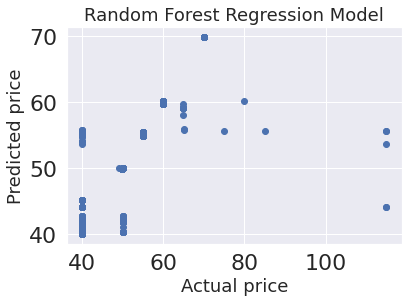

In [ ]:
plt.rcParams['agg.path.chunksize'] = 1000000
# set no of points
plt.scatter(y_test,y_pred_rf_random1)
plt.xlabel("Actual price",fontsize = 18)
plt.ylabel("Predicted price",fontsize = 18)
plt.title("Random Forest Regression Model",fontsize = 18)

These results look so much better than linear models.

#### Random forest also seems to be peaking even with change of hyperparameters

In [ ]:
result

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
0,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
0,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
0,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
0,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752
0,Baseline Lasso Regression on scaled features,0.5326991406015515,3.6065146432372046,4.422526921397267
0,Lasso Regression Grid search on scaled features 20 folds,0.7854779211932397,2.414093169388218,2.996457993514633
0,Baseline Elasticnet Regression on scaled features,0.5147539224408982,3.553359597250637,4.506643580906438
0,Elasticnet Regression Grid search on scaled features 10 folds,0.7854777099272492,2.4141918676693206,2.996459469002642
0,Elasticnet Regression Grid search on scaled features 20 folds,0.7837431255490017,2.4179530938470646,3.006192449853415


### Ada boost

In [ ]:
#ada_baseline.get_params().keys()

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
ada_baseline = AdaBoostRegressor(random_state = 101)
ada_baseline.fit(X_train,y_train)  
y_pred_ada_baseline = ada_baseline.predict(X_test)

r2_ada_baseline = r2_score(y_test,y_pred_ada_baseline)
mae_ada_baseline = mean_absolute_error(y_test,y_pred_ada_baseline) 
rmse_ada_baseline =  sqrt(mean_squared_error(y_test,y_pred_ada_baseline))


print("R2: " + str(r2_ada_baseline))
print("MAE: ", str(mae_ada_baseline))
print("RMSE: ", str(rmse_ada_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline Ada Boost Regression'], 'R2 score':str(r2_ada_baseline),'MAE':str(mae_ada_baseline),'RMSE': str(rmse_ada_baseline)}))


R2: 0.8382134753539906
MAE:  1.6844882703931612
RMSE:  2.6022161532008568


### GBM

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gbm_baseline = GradientBoostingRegressor(random_state=101)
gbm_baseline.fit(X_train,y_train)  
y_pred_gbm_baseline = gbm_baseline.predict(X_test)

r2_gbm_baseline = r2_score(y_test,y_pred_gbm_baseline)
mae_gbm_baseline = mean_absolute_error(y_test,y_pred_gbm_baseline) 
rmse_gbm_baseline =  sqrt(mean_squared_error(y_test,y_pred_gbm_baseline))


print("R2: " + str(r2_gbm_baseline))
print("MAE: ", str(mae_gbm_baseline))
print("RMSE: ", str(rmse_gbm_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline GBM Regression'], 'R2 score':str(r2_gbm_baseline),'MAE':str(mae_gbm_baseline),'RMSE': str(rmse_gbm_baseline)}))



R2: 0.9283637907370174
MAE:  0.7151859850755389
RMSE:  1.7315637830631434


### XGBoost

In [ ]:
import xgboost as xgb
xgb_baseline = xgb.XGBRegressor( random_state=101)
xgb_baseline.fit(X_train,y_train)
y_pred_xgb_baseline = xgb_baseline.predict(X_test)

r2_xgb_baseline = r2_score(y_test,y_pred_xgb_baseline)
mae_xgb_baseline = mean_absolute_error(y_test,y_pred_xgb_baseline) 
rmse_xgb_baseline =  sqrt(mean_squared_error(y_test,y_pred_xgb_baseline))


print("R2: " + str(r2_xgb_baseline))
print("MAE: ", str(mae_xgb_baseline))
print("RMSE: ", str(rmse_xgb_baseline))

result = result.append(pd.DataFrame({'Model Name':['Baseline XGBoost Regression'], 'R2 score':str(r2_xgb_baseline),'MAE':str(mae_xgb_baseline),'RMSE': str(rmse_xgb_baseline)}))



[01:43:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
R2: 0.9285428470735395
MAE:  0.7128864444332323
RMSE:  1.7293983875471801


* R2: 0.92840278568276
* MAE: 0.5778207520400023
* RMSE: 1.72973622772864

#### Randomized search

In [ ]:
# Executed this code locally on system
"""
import xgboost as xgb

xgb_model = xgb.XGBRegressor(random_state = 101)

parameters={'min_child_weight':[1,3,5],'max_depth': [3,4,5], 'n_estimators': [1000,1500,2000]
                            ,'learning_rate' : [0.01,0.001,0.0001],'gamma' : [0,0.2],
                            'reg_alpha' : [0.01,0.05]}

xgb_random1 = RandomizedSearchCV(xgb_model,parameters,scoring='r2',cv=2
                                 ,verbose=1,n_jobs=-1)

xgb_random1.fit(X_train,y_train)  
"""
"""
y_pred_xgb_random1 = xgb_random1.predict(X_test)  

r2_xgb_random1 = r2_score(y_test,y_pred_xgb_random1)
mae_xgb_random1 = mean_absolute_error(y_test,y_pred_xgb_random1) 
rmse_xgb_random1 =  sqrt(mean_squared_error(y_test,y_pred_xgb_random1))


print("R2: " + str(r2_xgb_random1))
print("MAE: ", str(mae_xgb_random1))
print("RMSE: ", str(rmse_xgb_random1))

result = result.append(pd.DataFrame({'Model Name':[' XGBoost Regression Randomized 2 fold'], 'R2 score':str(0.9287151719754384),'MAE':str(0.5915719169978657),'RMSE': str(1.7259585907167008)}))
"""


'\ny_pred_xgb_random1 = xgb_random1.predict(X_test)  \n\nr2_xgb_random1 = r2_score(y_test,y_pred_xgb_random1)\nmae_xgb_random1 = mean_absolute_error(y_test,y_pred_xgb_random1) \nrmse_xgb_random1 =  sqrt(mean_squared_error(y_test,y_pred_xgb_random1))\n\n\nprint("R2: " + str(r2_xgb_random1))\nprint("MAE: ", str(mae_xgb_random1))\nprint("RMSE: ", str(rmse_xgb_random1))\n\nresult = result.append(pd.DataFrame({\'Model Name\':[\' XGBoost Regression Randomized 2 fold\'], \'R2 score\':str(0.9287151719754384),\'MAE\':str(0.5915719169978657),\'RMSE\': str(1.7259585907167008)}))\n'

* R2: 0.9287151719754384
* MAE: 0.5915719169978657
* RMSE: 1.7259585907167008

In [ ]:
result = result.append(pd.DataFrame({'Model Name':[' XGBoost Regression Randomized 2 fold'], 'R2 score':str(0.9287151719754384),'MAE':str(0.5915719169978657),'RMSE': str(1.7259585907167008)}))


In [ ]:
#xgb_random1.best_params_


{'reg_alpha': 0.05, 'n_estimators': 1500, 'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0}

#### Compare actual price vs predictions made by the xgboost regression model

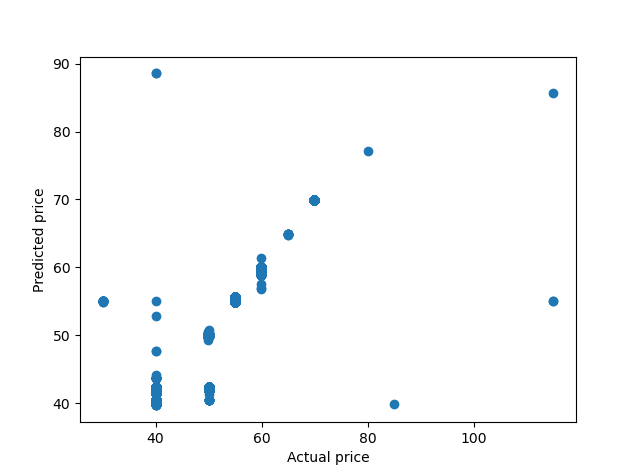

In [ ]:
from IPython.display import Image
Image('/content/xgboost randomized.png')

#### Results look similar to random forest, better than linear model

#### Neural networks

In [ ]:
from tensorflow import keras
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense, Activation,Dropout,LSTM,Embedding, Flatten, LeakyReLU, BatchNormalization
from tensorflow.keras.callbacks   import EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras.wrappers.scikit_learn  import KerasRegressor
from tensorflow.keras.activations import relu, sigmoid


In [ ]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train_scaled.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

# Fitting the ANN to the Training set
model_history= NN_model.fit(X_train_scaled, y_train, batch_size = 64, epochs = 10)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               2688      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 167,553
Trainable params: 167,553
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
13554/13554 [==========================

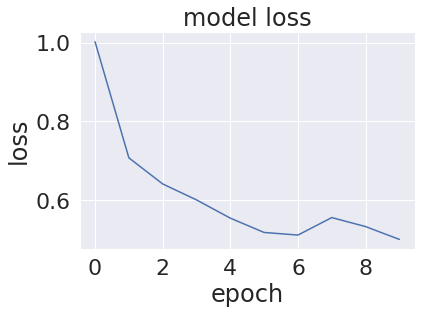

In [ ]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#### The loss seems to be decreasing as expected

In [ ]:
annpred = NN_model.predict(X_test_scaled)
r2_ann = r2_score(y_test,annpred)
mae_ann = mean_absolute_error(y_test,annpred) 
rmse_ann =  sqrt(mean_squared_error(y_test,annpred))

result = result.append(pd.DataFrame({'Model Name':[' Artificial Neural network'], 'R2 score':str(r2_ann),'MAE':str(mae_ann),'RMSE': str(rmse_ann)}))


9036/9036 [==============================] - 21s 2ms/step


In [ ]:
print("R2: " + str(r2_ann))
print("MAE: ", str(mae_ann))
print("RMSE: ", str(rmse_ann))

R2: 0.9110563665677295
MAE:  0.40745178767633744
RMSE:  1.9294326740805283


### Neural networks tend to perform better than linear models for tabular data, but it's not considered the best model family. That is what we have observed from our results. Neural nets have achieved better accuracy than linear models but tree based models were a tad bit better.

# Results

In [ ]:
result.reset_index(drop=True)

,Model Name,R2 score,MAE,RMSE
0,Baseline Linear Regression,0.785477946503195,2.414084156349595,2.996457816749097
1,Polynomial Regression,0.8667133741693545,1.59434274038019,2.3619216245648427
2,Baseline Ridge Regression on scaled features,0.7854779461764777,2.4140872314299027,2.9964578190309012
3,"Ridge Regression Grid search on scaled features, 5 folds",0.7854779461764777,2.4140872314299027,2.9964578190309012
4,Ridge Regression Grid search on scaled features 20 folds,0.7854779446496987,2.414099531521399,2.9964578296939752
5,Baseline Lasso Regression on scaled features,0.5326991406015515,3.6065146432372046,4.422526921397267
6,Lasso Regression Grid search on scaled features 20 folds,0.7854779211932397,2.414093169388218,2.996457993514633
7,Baseline Elasticnet Regression on scaled features,0.5147539224408982,3.553359597250637,4.506643580906438
8,Elasticnet Regression Grid search on scaled features 10 folds,0.7854777099272492,2.4141918676693206,2.996459469002642
9,Elasticnet Regression Grid search on scaled features 20 folds,0.7837431255490017,2.4179530938470646,3.006192449853415


### Above table shows the metric scores for R2, MAE, RMSE for all the model versions that we have trained. Tree based models have outperformed all other models as they explain most of the variance in the model.

# Conclusion

### So far in our project we have utilized capabilities of different models like Linear models with/without regularization, tree based models, ensemble methods, Neural networks etc., to carry out comprehensive price regression. It is a common notion that ISPs don’t alter their plans for downtrodden sections of society as it is difficult to segregate sections of society according to economic conditions. Therefore, the analysis and inferences from modeling on this data can be helpful to highlight trends in prices for different features like download speed, geograohical locations etc for internet offer plans by different Internet Service Providers. Potential customer can use results of this extensive analysis to aid their decision making process when choosing a plan in their location of their residence.